# Task 6.2 Visualizations & Correlations

<a id='0'></a> <br>
 # Table of Contents  

1. [Importing Visualization Libraries and Data](#1)
1. [Select Variables for Analysis](#2)
1. [Correlation Matrix Heatmap](#3)
1. [Scatterplots](#4)
1. [Pair Plot](#5)
1. [Categorical Plot](#6)
1. [Key Questions Answered](#7)
1. [Define Hypotheses](#8)

<a id='1'></a> <br>
## 1. Importing Visualization Libraries and Data

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import os

In [2]:
# This option ensures the charts you create are displayed in the notebook without the need to "call" them specifically.

%matplotlib inline

In [3]:
# Define path

path = r'G:\My Drive\CareerFoundry\Python Projects\2024-3 Data Immersion Task 6.2'

In [ ]:
# Import data

df_sbs = pd.read_pickle(os.path.join(path, '02 Data', 'Original Data', 'df_sbs_clean_no_dupes.pkl'))

In [ ]:
# check df

df_sbs.shape

In [ ]:
df_sbs.head()

In [4]:
# set # of rows and columns to show

pd.set_option('display.max_columns', 135)
pd.set_option('display.max_rows', 60)

In [ ]:
df_sbs.tail()

#

### Before moving forward, I will remove the 2nd and 3rd Univ. cols, keeping and giving credit to only the last school attended (graduated from). Then add new column with state college is located in

In [ ]:
# create copy of df

df_sbs_v2 = df_sbs.copy()

In [ ]:
# check df

df_sbs_v2.shape

In [ ]:
df_sbs_v2.head()

In [ ]:
# replace univ col with univ 2 col if not 'nan'

df_sbs_v2.loc[df_sbs_v2['Player_Stats (College/Univ 2)'].ne('nan'), 'Player_Stats (College/Univ)'] = df_sbs_v2['Player_Stats (College/Univ 2)']

In [ ]:
# replace univ col with univ 3 col if not 'nan'

df_sbs_v2.loc[df_sbs_v2['Player_Stats (College/Univ 3)'].ne('nan'), 'Player_Stats (College/Univ)'] = df_sbs_copy['Player_Stats (College/Univ 3)']

In [ ]:
# export out as csv to check results

df_sbs_v2.to_csv(os.path.join(path, '02 Data','Prepared Data', 'df_sbs_v2.csv'))

#

### The formula worked, 2nd and 3rd colleges were moved to the 1st college column

In [ ]:
# delete the 2nd and 3rd college cols

df_sbs_v2.drop(['Player_Stats (College/Univ 2)', 'Player_Stats (College/Univ 3)'], axis=1, inplace=True)

In [ ]:
# check result

df_sbs_v2.head()

#

### Add State of College col

In [ ]:
# Import data

df_univ_states = pd.read_csv(os.path.join(path, '02 Data', 'Original Data', 'college_states.csv'))

In [ ]:
# check df

df_univ_states.shape

In [ ]:
df_univ_states.head()

In [ ]:
# rename cols in df_univ_states to match df_sbs_v2

df_univ_states = df_univ_states.rename(columns={'College/Univ': 'Player_Stats (College/Univ)', 'State': 'Player_Stats (Univ_State)'}, inplace=False)

In [ ]:
# check result

df_univ_states.head()

In [ ]:
# use left join to merge dfs

df_sbs_v3 = pd.merge(left=df_sbs_v2, right=df_univ_states, how='left')

In [ ]:
# check new df

df_sbs_v3.head()

In [ ]:
df_sbs_v3.shape

In [ ]:
# move column 'Player_Stats (Univ_State)' to be ninth from the left (index 1)

col = df_sbs_v3.pop('Player_Stats (Univ_State)')
df_sbs_v3.insert(8, col.name, col)

In [ ]:
# check result

df_sbs_v3.head()

In [ ]:
# check for value_counts in the 'Player_Stats (Univ_State)' column

df_sbs_v3['Player_Stats (Univ_State)'].value_counts()

In [ ]:
# export out as csv to check non-us state monograms

df_sbs_v3.to_csv(os.path.join(path, '02 Data','Prepared Data', 'df_sbs_v3.csv'))

#

### All Universities, Univ_States are clean

In [5]:
# Import clean v3 data

df_sbs_v3 = pd.read_csv(os.path.join(path, '02 Data', 'Prepared Data', 'df_sbs_v3.csv'), index_col=0)

In [6]:
# check df

df_sbs_v3.shape

(6538, 68)

In [7]:
df_sbs_v3.head()

,Player_Stats (SB),Player_Stats (Key),Player_Stats (Player),Player_Stats (No.),Player_Stats (Age),Player_Stats (Pos),Player_Stats (College/Univ),Player_Stats (Univ_State),Player_Stats (BirthDate),Player_Stats (Yrs),Player_Stats (Super_bowl),Player_Stats (Team),Player_Stats (Pts),Player_Stats (MVP),Player_Stats (Stadium),Player_Stats (City),Player_Stats (State),Player_Stats (Date),Player_Stats (W/L),O_Passing (Cmp),O_Passing (Att),O_Passing (Yds),O_Passing (TD),O_Passing (Int),O_Passing (Sk),O_Passing (Yds.1),O_Passing (Lng),O_Passing (Rate),O_Rushing (Att),O_Rushing (Yds),O_Rushing (TD),O_Rushing (Lng),O_Receiving (Rec),O_Receiving (Yds),O_Receiving (TD),O_Receiving (Lng),O_Fumbles (Fmb),O_Fumbles (FL),D_Interceptions (Int),D_Interceptions (Yds),D_Interceptions (TD),D_Interceptions (Lng),D_Sacks (Sk),D_Tackles (Comb),D_Tackles (Solo),D_Tackles (Ast),D_Fumbles (FR),D_Fumbles (Yds),D_Fumbles (TD),D_Fumbles (FF),SPT_Kick_Returns (Rt),SPT_Kick_Returns (Yds),SPT_Kick_Returns (Y/Rt),SPT_Kick_Returns (TD),SPT_Kick_Returns (Lng),SPT_Punt_Returns (Ret),SPT_Punt_Returns (Yds),SPT_Punt_Returns (Y/R),SPT_Punt_Returns (TD),SPT_Punt_Returns (Lng),SPT_Scoring (XPM),SPT_Scoring (XPA),SPT_Scoring (FGM),SPT_Scoring (FGA),SPT_Punting (Pnt),SPT_Punting (Yds),SPT_Punting (Y/P),SPT_Punting (Lng)
Player_Stats (Tm),,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ARI,43,ARI43,Aaron Francisco,47,25,DB,BYU,UT,7/5/1983,3,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0
ARI,43,ARI43,Adrian Wilson,24,29,SS,North Carolina St.,NC,10/12/1979,7,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,7,7,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0
ARI,43,ARI43,Alan Branch,78,24,DT,Michigan,MI,12/29/1984,1,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0
ARI,43,ARI43,Ali Highsmith,95,23,LB,LSU,LA,1/20/1985,0,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0
ARI,43,ARI43,Anquan Boldin,81,28,WR,Florida St.,FL,10/3/1980,5,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,8,84,0,45,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0


#

<a id='2'></a> <br>
## 2. Select Variables for Analysis
> ### Questions to explore

    * Which college has the most Super Bowl alumni?
    * Which city and state, via the colleges, produced the most Super Bowl alumni? 
    * Which college has the most Super Bowl wins? 
    * Which college has the most Super Bowl mvps? 
    * Who is/are the most prominent player(s) from the top 10 colleges? 
    * Which college has the best stats? 
        o Passing yards 
        o Receiving yards  
        o # of receptions 
        o Tds 
        o Points 
    * Does having more players from the same college on a team give you a better chance of winning the Super Bowl? 
    * Does having players from higher ranked college teams help to win Super Bowls? 

### Based on these questions I will remove the following variables:
    Player_Stats (Tm)
    Player_Stats (SB)
    Player_Stats (Key)
    O_Passing (Att) 
    O_Passing (Int)
    O_Passing (Sk)
    O_Passing (Yds.1) 
    O_Passing (Lng) 
    O_Rushing (Att)
    O_Rushing (Lng)
    O_Fumbles (Fmb)
    O_Fumbles (FL)
    D_Tackles (Comb)
    D_Tackles (Ast)
    SPT_Kick_Returns (Rt)
    SPT_Punt_Returns (Ret)
    SPT_Punt_Returns (TD)
    SPT_Scoring (XPA)
    SPT_Scoring (FGA)
    SPT_Scoring (FGA)
    SPT_Punting (Pnt)
    SPT_Punting (Yds)
    SPT_Punting (Y/P)
    SPT_Punting (Lng) 

In [ ]:
# create a copy of df_sbs_v3 minus the above cols

df_sbs_dropcols_v4 = df_sbs_v3.drop(['Player_Stats (Tm)', 'Player_Stats (SB)', 'Player_Stats (Key)', 'O_Passing (Att)', 'O_Passing (Int)', 'O_Passing (Sk)', 'O_Passing (Yds.1)', 'O_Passing (Lng)', 'O_Rushing (Att)', 'O_Rushing (Lng)', 'O_Fumbles (Fmb)', 'O_Fumbles (FL)', 'D_Tackles (Comb)', 'D_Tackles (Ast)', 'SPT_Kick_Returns (Rt)', 'SPT_Punt_Returns (Ret)', 'SPT_Punt_Returns (TD)', 'SPT_Scoring (XPA)', 'SPT_Scoring (FGA)', 'SPT_Scoring (FGA)', 'SPT_Punting (Pnt)', 'SPT_Punting (Yds)', 'SPT_Punting (Y/P)', 'SPT_Punting (Lng)'], axis=1)

In [ ]:
# check new df

df_sbs_dropcols_v4.shape

In [ ]:
df_sbs_dropcols_v4.head()

In [ ]:
# export as pkl

df_sbs_dropcols_v4.to_pickle(os.path.join(path, '02 Data','Prepared Data', 'df_sbs_dropcols_v4.pkl'))

In [8]:
df_sbs_dropcols_v4 = pd.read_pickle(os.path.join(path, '02 Data', 'Prepared Data', 'df_sbs_dropcols_v4.pkl'))

#

<a id='3'></a> <br>
## 3. Correlation Matrix Heatmap

In [9]:
# create sub_df with necessary variables

sub_df = df_sbs_dropcols_v4.drop(['Player_Stats (No.)', 'Player_Stats (Pos)', 'Player_Stats (Player)', 'Player_Stats (College/Univ)', 'Player_Stats (Univ_State)', 'Player_Stats (Team)', 'Player_Stats (BirthDate)', 'Player_Stats (Super_bowl)', 'Player_Stats (MVP)', 'Player_Stats (Stadium)', 'Player_Stats (City)', 'Player_Stats (State)', 'Player_Stats (Date)'], axis=1).copy()

In [10]:
# check sub_df

sub_df.shape

(6538, 33)

In [11]:
sub_df.head()

,Player_Stats (Age),Player_Stats (Yrs),Player_Stats (Pts),Player_Stats (W/L),O_Passing (Cmp),O_Passing (Yds),O_Passing (TD),O_Passing (Rate),O_Rushing (Yds),O_Rushing (TD),O_Receiving (Rec),O_Receiving (Yds),O_Receiving (TD),O_Receiving (Lng),D_Interceptions (Int),D_Interceptions (Yds),D_Interceptions (TD),D_Interceptions (Lng),D_Sacks (Sk),D_Tackles (Solo),D_Fumbles (FR),D_Fumbles (Yds),D_Fumbles (TD),D_Fumbles (FF),SPT_Kick_Returns (Yds),SPT_Kick_Returns (Y/Rt),SPT_Kick_Returns (TD),SPT_Kick_Returns (Lng),SPT_Punt_Returns (Yds),SPT_Punt_Returns (Y/R),SPT_Punt_Returns (Lng),SPT_Scoring (XPM),SPT_Scoring (FGM)
0,25,3,23,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0.0,1,0,0,0,0,0,0.0,0,0,0,0.0,0,0,0
1,29,7,23,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0.0,7,0,0,0,0,0,0.0,0,0,0,0.0,0,0,0
2,24,1,23,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0.0,0,0,0,0.0,0,0,0
3,23,0,23,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0.0,0,0,0,0.0,0,0,0
4,28,5,23,0,0,0,0,0.0,0,0,8,84,0,45,0,0,0,0,0.0,0,0,0,0,0,0,0.0,0,0,0,0.0,0,0,0


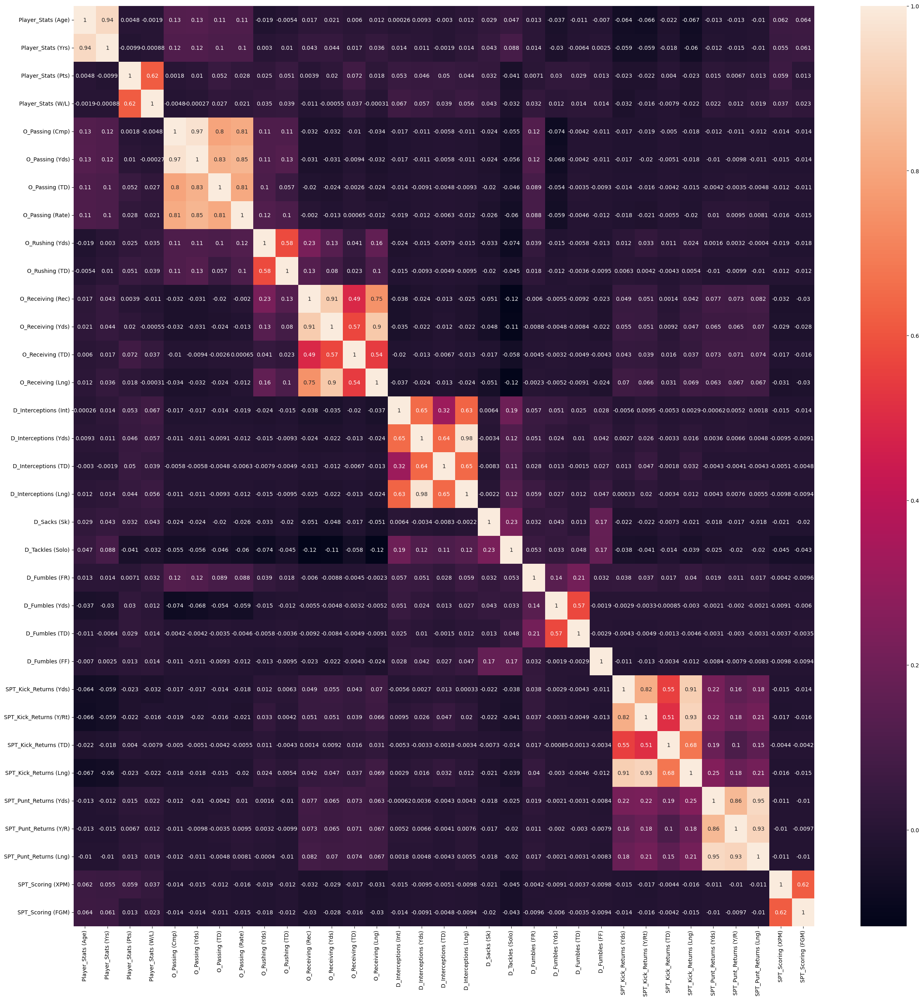

In [12]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(30,30))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr = sns.heatmap(sub_df.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

### The heatmap is too large to read and many of the relationships are irrelevant.
### Instead I will make 3 heatmaps: 1 for offense, 1 for defense, 1 for spt (only include players that have active stats in those categories) and compare them to player age and yrs.

In [13]:
# create 3 sub_df with necessary variables

sub_df_off = sub_df.drop(['Player_Stats (Pts)', 'Player_Stats (W/L)', 'D_Interceptions (Int)', 'D_Interceptions (Yds)', 'D_Interceptions (TD)', 'D_Interceptions (Lng)', 'D_Sacks (Sk)', 'D_Tackles (Solo)', 'D_Fumbles (FR)', 'D_Fumbles (Yds)', 'D_Fumbles (TD)', 'D_Fumbles (FF)', 'SPT_Kick_Returns (Yds)', 'SPT_Kick_Returns (Y/Rt)', 'SPT_Kick_Returns (TD)', 'SPT_Kick_Returns (Lng)', 'SPT_Punt_Returns (Yds)', 'SPT_Punt_Returns (Y/R)', 'SPT_Punt_Returns (Lng)', 'SPT_Scoring (XPM)', 'SPT_Scoring (FGM)'], axis=1).copy()
sub_df_def = sub_df.drop(['Player_Stats (Pts)', 'Player_Stats (W/L)', 'O_Passing (Cmp)', 'O_Passing (Yds)', 'O_Passing (TD)', 'O_Passing (Rate)', 'O_Rushing (Yds)', 'O_Rushing (TD)', 'O_Receiving (Rec)', 'O_Receiving (Yds)', 'O_Receiving (TD)', 'O_Receiving (Lng)', 'SPT_Kick_Returns (Yds)', 'SPT_Kick_Returns (Y/Rt)', 'SPT_Kick_Returns (TD)', 'SPT_Kick_Returns (Lng)', 'SPT_Punt_Returns (Yds)', 'SPT_Punt_Returns (Y/R)', 'SPT_Punt_Returns (Lng)', 'SPT_Scoring (XPM)', 'SPT_Scoring (FGM)'], axis=1).copy()
sub_df_spt = sub_df.drop(['Player_Stats (Pts)', 'Player_Stats (W/L)', 'O_Passing (Cmp)', 'O_Passing (Yds)', 'O_Passing (TD)', 'O_Passing (Rate)', 'O_Rushing (Yds)', 'O_Rushing (TD)', 'O_Receiving (Rec)', 'O_Receiving (Yds)', 'O_Receiving (TD)', 'O_Receiving (Lng)', 'D_Interceptions (Int)', 'D_Interceptions (Yds)', 'D_Interceptions (TD)', 'D_Interceptions (Lng)', 'D_Sacks (Sk)', 'D_Tackles (Solo)', 'D_Fumbles (FR)', 'D_Fumbles (Yds)', 'D_Fumbles (TD)', 'D_Fumbles (FF)'], axis=1).copy()

#

#### Offense

In [14]:
# check results

sub_df_off.head()

,Player_Stats (Age),Player_Stats (Yrs),O_Passing (Cmp),O_Passing (Yds),O_Passing (TD),O_Passing (Rate),O_Rushing (Yds),O_Rushing (TD),O_Receiving (Rec),O_Receiving (Yds),O_Receiving (TD),O_Receiving (Lng)
0,25,3,0,0,0,0.0,0,0,0,0,0,0
1,29,7,0,0,0,0.0,0,0,0,0,0,0
2,24,1,0,0,0,0.0,0,0,0,0,0,0
3,23,0,0,0,0,0.0,0,0,0,0,0,0
4,28,5,0,0,0,0.0,0,0,8,84,0,45


In [15]:
# add a total column to find records that have 0 in all categories

# specify the columns to sum
cols = ['O_Passing (Cmp)', 'O_Passing (Yds)', 'O_Passing (TD)', 'O_Passing (Rate)', 'O_Rushing (Yds)', 'O_Rushing (TD)', 'O_Receiving (Rec)', 'O_Receiving (Yds)', 'O_Receiving (TD)', 'O_Receiving (Lng)']

# find sum of columns specified 
sub_df_off['Total'] = sub_df_off[cols].sum(axis=1)

In [16]:
sub_df_off.head()

,Player_Stats (Age),Player_Stats (Yrs),O_Passing (Cmp),O_Passing (Yds),O_Passing (TD),O_Passing (Rate),O_Rushing (Yds),O_Rushing (TD),O_Receiving (Rec),O_Receiving (Yds),O_Receiving (TD),O_Receiving (Lng),Total
0,25,3,0,0,0,0.0,0,0,0,0,0,0,0.0
1,29,7,0,0,0,0.0,0,0,0,0,0,0,0.0
2,24,1,0,0,0,0.0,0,0,0,0,0,0,0.0
3,23,0,0,0,0,0.0,0,0,0,0,0,0,0.0
4,28,5,0,0,0,0.0,0,0,8,84,0,45,137.0


In [17]:
sub_df_off.shape

(6538, 13)

In [18]:
# Drop rows where Total col is equal to 0

sub_df_off = sub_df_off[sub_df_off['Total'] != 0]

In [19]:
sub_df_off.shape

(987, 13)

In [20]:
# drop Total col for heatmap analysis

sub_df_off.drop('Total', axis=1, inplace=True)

In [21]:
sub_df_off.head()

,Player_Stats (Age),Player_Stats (Yrs),O_Passing (Cmp),O_Passing (Yds),O_Passing (TD),O_Passing (Rate),O_Rushing (Yds),O_Rushing (TD),O_Receiving (Rec),O_Receiving (Yds),O_Receiving (TD),O_Receiving (Lng)
4,28,5,0,0,0,0.0,0,0,8,84,0,45
8,24,1,0,0,0,0.0,0,0,1,1,1,1
19,30,9,0,0,0,0.0,33,0,4,28,0,11
24,25,3,0,0,0,0.0,0,0,2,35,0,22
26,28,4,0,0,0,0.0,0,0,1,18,0,18


#

#### Defense

In [22]:
sub_df_def.head()

,Player_Stats (Age),Player_Stats (Yrs),D_Interceptions (Int),D_Interceptions (Yds),D_Interceptions (TD),D_Interceptions (Lng),D_Sacks (Sk),D_Tackles (Solo),D_Fumbles (FR),D_Fumbles (Yds),D_Fumbles (TD),D_Fumbles (FF)
0,25,3,0,0,0,0,0.0,1,0,0,0,0
1,29,7,0,0,0,0,0.0,7,0,0,0,0
2,24,1,0,0,0,0,0.0,0,0,0,0,0
3,23,0,0,0,0,0,0.0,0,0,0,0,0
4,28,5,0,0,0,0,0.0,0,0,0,0,0


In [23]:
# add a total column to find records that have 0 in all categories

# specify the columns to sum
cols = ['D_Interceptions (Int)', 'D_Interceptions (Yds)', 'D_Interceptions (TD)', 'D_Interceptions (Lng)', 'D_Sacks (Sk)', 'D_Tackles (Solo)', 'D_Fumbles (FR)', 'D_Fumbles (Yds)', 'D_Fumbles (TD)', 'D_Fumbles (FF)']

# find sum of columns specified 
sub_df_def['Total'] = sub_df_def[cols].sum(axis=1)

In [24]:
sub_df_def.head()

,Player_Stats (Age),Player_Stats (Yrs),D_Interceptions (Int),D_Interceptions (Yds),D_Interceptions (TD),D_Interceptions (Lng),D_Sacks (Sk),D_Tackles (Solo),D_Fumbles (FR),D_Fumbles (Yds),D_Fumbles (TD),D_Fumbles (FF),Total
0,25,3,0,0,0,0,0.0,1,0,0,0,0,1.0
1,29,7,0,0,0,0,0.0,7,0,0,0,0,7.0
2,24,1,0,0,0,0,0.0,0,0,0,0,0,0.0
3,23,0,0,0,0,0,0.0,0,0,0,0,0,0.0
4,28,5,0,0,0,0,0.0,0,0,0,0,0,0.0


In [25]:
sub_df_def.shape

(6538, 13)

In [26]:
# Drop rows where Total col is equal to 0

sub_df_def = sub_df_def[sub_df_def['Total'] != 0]

In [27]:
sub_df_def.shape

(1680, 13)

In [28]:
# drop Total col for heatmap analysis

sub_df_def.drop('Total', axis=1, inplace=True)

In [29]:
sub_df_def.head()

,Player_Stats (Age),Player_Stats (Yrs),D_Interceptions (Int),D_Interceptions (Yds),D_Interceptions (TD),D_Interceptions (Lng),D_Sacks (Sk),D_Tackles (Solo),D_Fumbles (FR),D_Fumbles (Yds),D_Fumbles (TD),D_Fumbles (FF)
0,25,3,0,0,0,0,0.0,1,0,0,0,0
1,29,7,0,0,0,0,0.0,7,0,0,0,0
5,27,4,0,0,0,0,0.0,1,0,0,0,0
6,26,3,0,0,0,0,0.0,1,0,0,0,0
11,22,0,0,0,0,0,0.0,2,0,0,0,0


#

#### Special Teams

In [30]:
sub_df_spt.head()

,Player_Stats (Age),Player_Stats (Yrs),SPT_Kick_Returns (Yds),SPT_Kick_Returns (Y/Rt),SPT_Kick_Returns (TD),SPT_Kick_Returns (Lng),SPT_Punt_Returns (Yds),SPT_Punt_Returns (Y/R),SPT_Punt_Returns (Lng),SPT_Scoring (XPM),SPT_Scoring (FGM)
0,25,3,0,0.0,0,0,0,0.0,0,0,0
1,29,7,0,0.0,0,0,0,0.0,0,0,0
2,24,1,0,0.0,0,0,0,0.0,0,0,0
3,23,0,0,0.0,0,0,0,0.0,0,0,0
4,28,5,0,0.0,0,0,0,0.0,0,0,0


In [31]:
# add a total column to find records that have 0 in all categories

# specify the columns to sum
cols = ['SPT_Kick_Returns (Yds)', 'SPT_Kick_Returns (Y/Rt)', 'SPT_Kick_Returns (TD)', 'SPT_Kick_Returns (Lng)', 'SPT_Punt_Returns (Yds)', 'SPT_Punt_Returns (Y/R)', 'SPT_Punt_Returns (Lng)', 'SPT_Scoring (XPM)', 'SPT_Scoring (FGM)']

# find sum of columns specified 
sub_df_spt['Total'] = sub_df_spt[cols].sum(axis=1)

In [32]:
sub_df_spt.head()

,Player_Stats (Age),Player_Stats (Yrs),SPT_Kick_Returns (Yds),SPT_Kick_Returns (Y/Rt),SPT_Kick_Returns (TD),SPT_Kick_Returns (Lng),SPT_Punt_Returns (Yds),SPT_Punt_Returns (Y/R),SPT_Punt_Returns (Lng),SPT_Scoring (XPM),SPT_Scoring (FGM),Total
0,25,3,0,0.0,0,0,0,0.0,0,0,0,0.0
1,29,7,0,0.0,0,0,0,0.0,0,0,0,0.0
2,24,1,0,0.0,0,0,0,0.0,0,0,0,0.0
3,23,0,0,0.0,0,0,0,0.0,0,0,0,0.0
4,28,5,0,0.0,0,0,0,0.0,0,0,0,0.0


In [33]:
sub_df_spt.shape

(6538, 12)

In [34]:
# Drop rows where Total col is equal to 0

sub_df_spt = sub_df_spt[sub_df_spt['Total'] != 0]

In [35]:
sub_df_spt.shape

(375, 12)

In [36]:
# drop Total col for heatmap analysis

sub_df_spt.drop('Total', axis=1, inplace=True)

In [37]:
sub_df_spt.head()

,Player_Stats (Age),Player_Stats (Yrs),SPT_Kick_Returns (Yds),SPT_Kick_Returns (Y/Rt),SPT_Kick_Returns (TD),SPT_Kick_Returns (Lng),SPT_Punt_Returns (Yds),SPT_Punt_Returns (Y/R),SPT_Punt_Returns (Lng),SPT_Scoring (XPM),SPT_Scoring (FGM)
24,25,3,82,20.5,0,23,0,0.0,0,0,0
40,32,8,0,0.0,0,0,0,0.0,0,3,0
48,25,1,9,9.0,0,9,34,17.0,34,0,0
60,28,4,17,8.5,0,16,0,0.0,0,0,0
90,38,16,0,0.0,0,0,0,0.0,0,1,2


# 

> ### Offensive heatmap

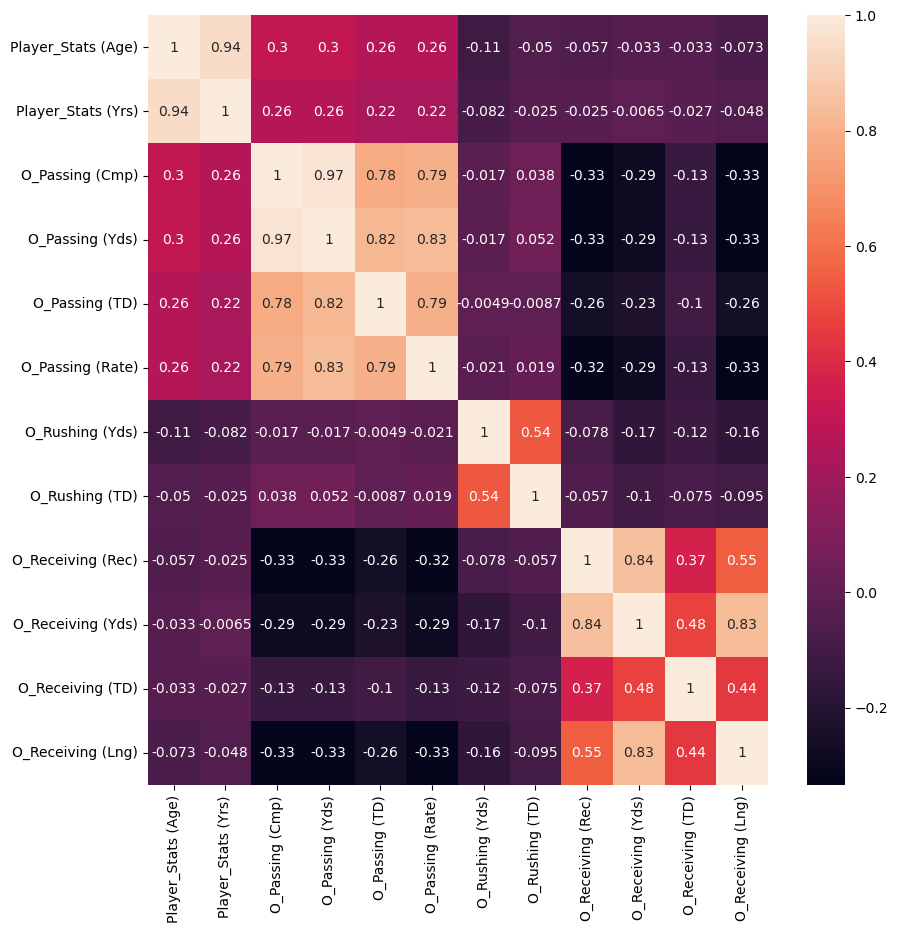

In [38]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(10,10))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr_off = sns.heatmap(sub_df_off.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

#

> ### Defensive heatmap

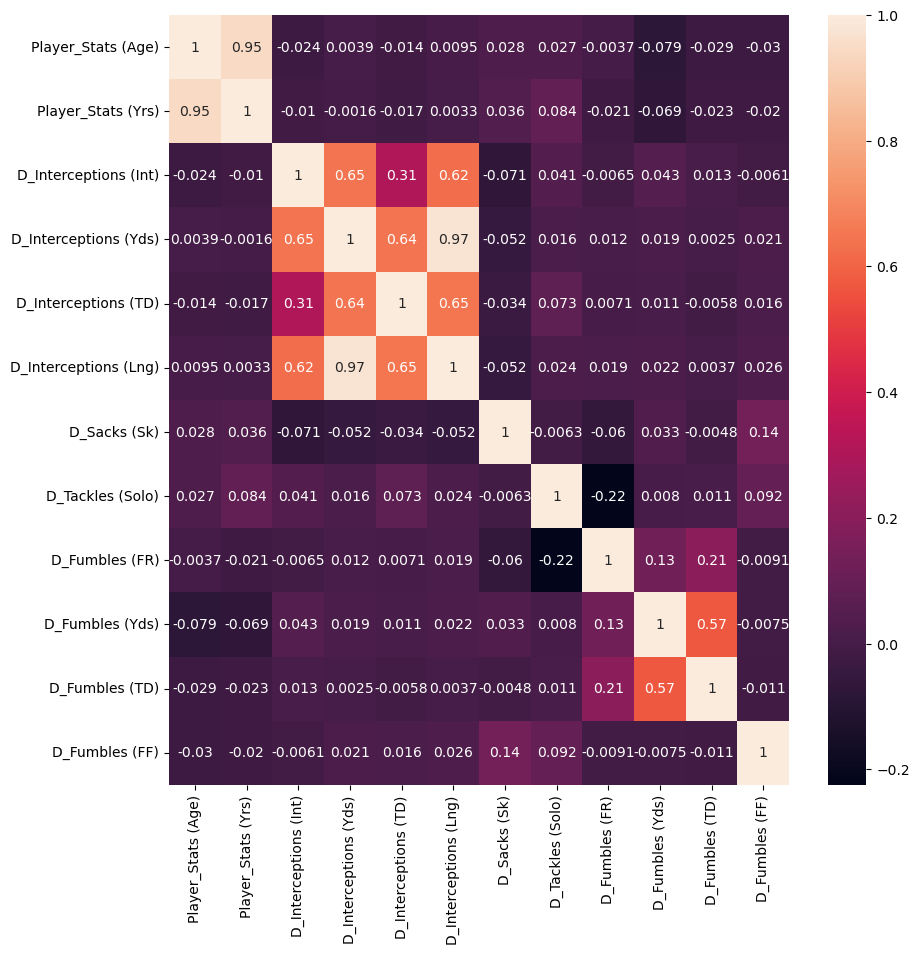

In [39]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(10,10))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr_def = sns.heatmap(sub_df_def.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

#

> ### Special Teams heatmap

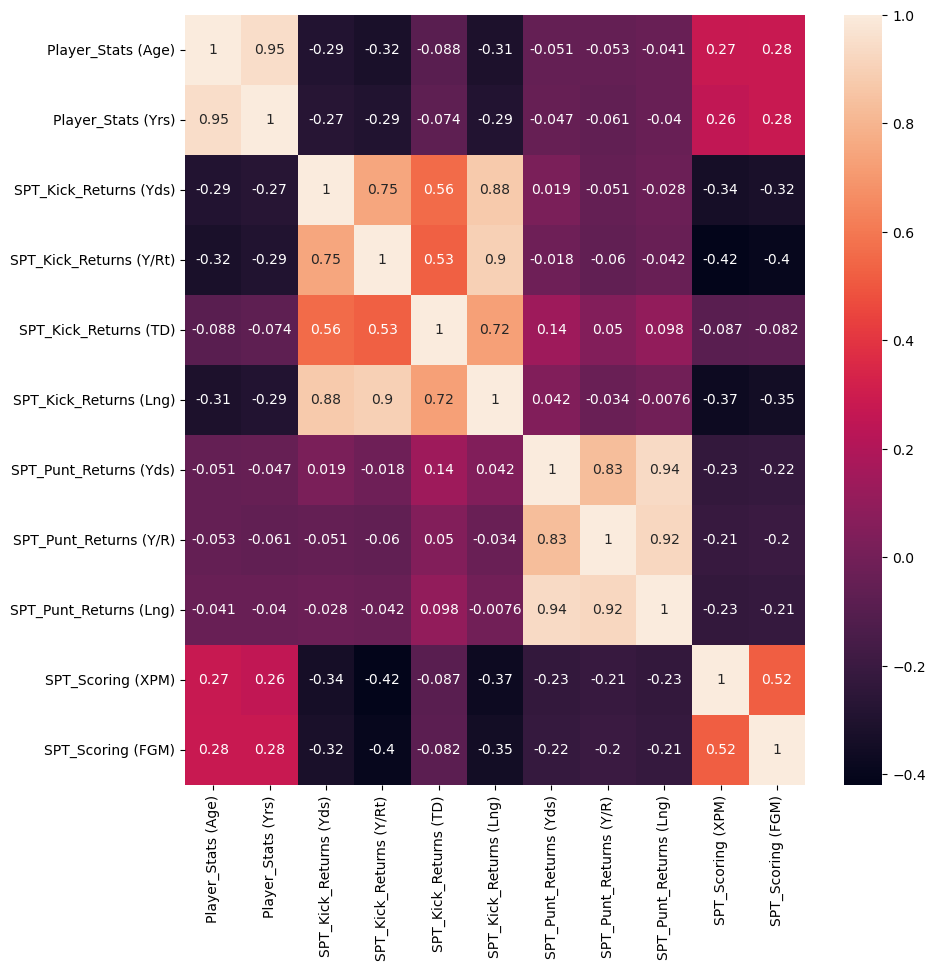

In [40]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(10,10))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr_spt = sns.heatmap(sub_df_spt.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

### The only variables that would be of interest are Player age and Player yrs (yrs active) and neither show any correlation to any other statistic worth exploring. The results of all 3 heatmaps are indicative of sports and statistical relationships.

### To answer my questions I need to create new variables:
    Players per team by univ AND State
    Players per sb by univ AND State
    Total wins by univ AND State
    Total rings by univ AND State
    # of college players per team
    % of college players per team

>### see Task 6.2 column derivations script for work

In [41]:
# Import data

df_sbs_v4 = pd.read_pickle(os.path.join(path, '02 Data', 'Prepared Data', 'df_sbs_v4.pkl'))

In [42]:
# check df

df_sbs_v4.shape

(6538, 80)

In [43]:
df_sbs_v4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6538 entries, 0 to 6537
Data columns (total 80 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Player_Stats (Tm)            6538 non-null   object 
 1   Player_Stats (SB)            6538 non-null   int64  
 2   Player_Stats (Key)           6538 non-null   object 
 3   Player_Stats (Player)        6538 non-null   object 
 4   Player_Stats (No.)           6538 non-null   int64  
 5   Player_Stats (Age)           6538 non-null   int64  
 6   Player_Stats (Pos)           6538 non-null   object 
 7   Player_Stats (College/Univ)  6525 non-null   object 
 8   Player_Stats (Univ_State)    6525 non-null   object 
 9   Player_Stats (BirthDate)     6538 non-null   object 
 10  Player_Stats (Yrs)           6538 non-null   int64  
 11  Player_Stats (Super_bowl)    6538 non-null   object 
 12  Player_Stats (Team)          6538 non-null   object 
 13  Player_Stats (Pts)

#### I checked out all the null values via csv and filled with either n/a or 0 where appropriate.
>#### Will import updated v4.csv, export as pkl, then import pkl

In [44]:
# Import data

df_sbs_v4 = pd.read_csv(os.path.join(path, '02 Data', 'Prepared Data', 'df_sbs_v4.csv'))

In [45]:
# export data as pkl

df_sbs_v4.to_pickle(os.path.join(path, '02 Data', 'Prepared Data', 'df_sbs_v4.pkl'))

In [46]:
# Import data

df_sbs_v4 = pd.read_pickle(os.path.join(path, '02 Data', 'Prepared Data', 'df_sbs_v4.pkl'))

In [47]:
# check df

df_sbs_v4.shape

(6538, 81)

In [48]:
df_sbs_v4.head()

,Unnamed: 0,Player_Stats (Tm),Player_Stats (SB),Player_Stats (Key),Player_Stats (Player),Player_Stats (No.),Player_Stats (Age),Player_Stats (Pos),Player_Stats (College/Univ),Player_Stats (Univ_State),Player_Stats (BirthDate),Player_Stats (Yrs),Player_Stats (Super_bowl),Player_Stats (Team),Player_Stats (Pts),Player_Stats (MVP),Player_Stats (Stadium),Player_Stats (City),Player_Stats (State),Player_Stats (Date),Player_Stats (W/L),O_Passing (Cmp),O_Passing (Att),O_Passing (Yds),O_Passing (TD),O_Passing (Int),O_Passing (Sk),O_Passing (Yds.1),O_Passing (Lng),O_Passing (Rate),O_Rushing (Att),O_Rushing (Yds),O_Rushing (TD),O_Rushing (Lng),O_Receiving (Rec),O_Receiving (Yds),O_Receiving (TD),O_Receiving (Lng),O_Fumbles (Fmb),O_Fumbles (FL),D_Interceptions (Int),D_Interceptions (Yds),D_Interceptions (TD),D_Interceptions (Lng),D_Sacks (Sk),D_Tackles (Comb),D_Tackles (Solo),D_Tackles (Ast),D_Fumbles (FR),D_Fumbles (Yds),D_Fumbles (TD),D_Fumbles (FF),SPT_Kick_Returns (Rt),SPT_Kick_Returns (Yds),SPT_Kick_Returns (Y/Rt),SPT_Kick_Returns (TD),SPT_Kick_Returns (Lng),SPT_Punt_Returns (Ret),SPT_Punt_Returns (Yds),SPT_Punt_Returns (Y/R),SPT_Punt_Returns (TD),SPT_Punt_Returns (Lng),SPT_Scoring (XPM),SPT_Scoring (XPA),SPT_Scoring (FGM),SPT_Scoring (FGA),SPT_Punting (Pnt),SPT_Punting (Yds),SPT_Punting (Y/P),SPT_Punting (Lng),Unique_Key,Univ_Alum_per_Team,Univ_Alum_per_SB,Univ_Total_Rings,Univ_Total_Wins,Univ_Total_MVPs,State_Alum_per_Team,State_Alum_per_SB,State_Total_Rings,State_Total_Wins,State_Total_MVPs
0,0,ARI,43,ARI43,Aaron Francisco,47,25,DB,BYU,UT,7/5/1983,3,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,ARI43Aaron Francisco,1.0,3.0,40.0,31.0,3.0,1.0,4.0,77.0,43.0,3.0
1,1,PIT,43,PIT43,Brett Keisel,99,30,RDE,BYU,UT,9/19/1978,6,XLIII,Pittsburgh Steelers,27,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,1,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,5,4,1,1,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,PIT43Brett Keisel,2.0,3.0,40.0,31.0,3.0,3.0,4.0,77.0,43.0,3.0
2,2,PIT,43,PIT43,Chris Hoke,76,32,DT,BYU,UT,4/6/1976,4,XLIII,Pittsburgh Steelers,27,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,1,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,PIT43Chris Hoke,2.0,3.0,40.0,31.0,3.0,3.0,4.0,77.0,43.0,3.0
3,3,PIT,43,PIT43,Chris Kemoeatu,68,25,LG,Utah,UT,1/4/1983,2,XLIII,Pittsburgh Steelers,27,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,1,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,PIT43Chris Kemoeatu,1.0,1.0,22.0,17.0,0.0,3.0,4.0,77.0,43.0,3.0
4,4,ATL,33,ATL33,Travis Hall,98,26,LDT,BYU,UT,8/3/1972,3,XXXIII,Atlanta Falcons,19,John Elway,Pro Player Stadium,Miami Gardens,Florida,1/31/1999,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,4,3,1,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,ATL33Travis Hall,1.0,1.0,40.0,31.0,3.0,2.0,2.0,77.0,43.0,3.0


In [49]:
df_sbs_v4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6538 entries, 0 to 6537
Data columns (total 81 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Unnamed: 0                   6538 non-null   int64  
 1   Player_Stats (Tm)            6538 non-null   object 
 2   Player_Stats (SB)            6538 non-null   int64  
 3   Player_Stats (Key)           6538 non-null   object 
 4   Player_Stats (Player)        6538 non-null   object 
 5   Player_Stats (No.)           6538 non-null   int64  
 6   Player_Stats (Age)           6538 non-null   int64  
 7   Player_Stats (Pos)           6538 non-null   object 
 8   Player_Stats (College/Univ)  6525 non-null   object 
 9   Player_Stats (Univ_State)    6525 non-null   object 
 10  Player_Stats (BirthDate)     6538 non-null   object 
 11  Player_Stats (Yrs)           6538 non-null   int64  
 12  Player_Stats (Super_bowl)    6538 non-null   object 
 13  Player_Stats (Team

In [51]:
del df_sbs_v4['Unnamed: 0']

In [52]:
# check result

df_sbs_v4.head()

,Player_Stats (Tm),Player_Stats (SB),Player_Stats (Key),Player_Stats (Player),Player_Stats (No.),Player_Stats (Age),Player_Stats (Pos),Player_Stats (College/Univ),Player_Stats (Univ_State),Player_Stats (BirthDate),Player_Stats (Yrs),Player_Stats (Super_bowl),Player_Stats (Team),Player_Stats (Pts),Player_Stats (MVP),Player_Stats (Stadium),Player_Stats (City),Player_Stats (State),Player_Stats (Date),Player_Stats (W/L),O_Passing (Cmp),O_Passing (Att),O_Passing (Yds),O_Passing (TD),O_Passing (Int),O_Passing (Sk),O_Passing (Yds.1),O_Passing (Lng),O_Passing (Rate),O_Rushing (Att),O_Rushing (Yds),O_Rushing (TD),O_Rushing (Lng),O_Receiving (Rec),O_Receiving (Yds),O_Receiving (TD),O_Receiving (Lng),O_Fumbles (Fmb),O_Fumbles (FL),D_Interceptions (Int),D_Interceptions (Yds),D_Interceptions (TD),D_Interceptions (Lng),D_Sacks (Sk),D_Tackles (Comb),D_Tackles (Solo),D_Tackles (Ast),D_Fumbles (FR),D_Fumbles (Yds),D_Fumbles (TD),D_Fumbles (FF),SPT_Kick_Returns (Rt),SPT_Kick_Returns (Yds),SPT_Kick_Returns (Y/Rt),SPT_Kick_Returns (TD),SPT_Kick_Returns (Lng),SPT_Punt_Returns (Ret),SPT_Punt_Returns (Yds),SPT_Punt_Returns (Y/R),SPT_Punt_Returns (TD),SPT_Punt_Returns (Lng),SPT_Scoring (XPM),SPT_Scoring (XPA),SPT_Scoring (FGM),SPT_Scoring (FGA),SPT_Punting (Pnt),SPT_Punting (Yds),SPT_Punting (Y/P),SPT_Punting (Lng),Unique_Key,Univ_Alum_per_Team,Univ_Alum_per_SB,Univ_Total_Rings,Univ_Total_Wins,Univ_Total_MVPs,State_Alum_per_Team,State_Alum_per_SB,State_Total_Rings,State_Total_Wins,State_Total_MVPs
0,ARI,43,ARI43,Aaron Francisco,47,25,DB,BYU,UT,7/5/1983,3,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,ARI43Aaron Francisco,1.0,3.0,40.0,31.0,3.0,1.0,4.0,77.0,43.0,3.0
1,PIT,43,PIT43,Brett Keisel,99,30,RDE,BYU,UT,9/19/1978,6,XLIII,Pittsburgh Steelers,27,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,1,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,5,4,1,1,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,PIT43Brett Keisel,2.0,3.0,40.0,31.0,3.0,3.0,4.0,77.0,43.0,3.0
2,PIT,43,PIT43,Chris Hoke,76,32,DT,BYU,UT,4/6/1976,4,XLIII,Pittsburgh Steelers,27,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,1,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,PIT43Chris Hoke,2.0,3.0,40.0,31.0,3.0,3.0,4.0,77.0,43.0,3.0
3,PIT,43,PIT43,Chris Kemoeatu,68,25,LG,Utah,UT,1/4/1983,2,XLIII,Pittsburgh Steelers,27,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,1,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,PIT43Chris Kemoeatu,1.0,1.0,22.0,17.0,0.0,3.0,4.0,77.0,43.0,3.0
4,ATL,33,ATL33,Travis Hall,98,26,LDT,BYU,UT,8/3/1972,3,XXXIII,Atlanta Falcons,19,John Elway,Pro Player Stadium,Miami Gardens,Florida,1/31/1999,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,4,3,1,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,ATL33Travis Hall,1.0,1.0,40.0,31.0,3.0,2.0,2.0,77.0,43.0,3.0


### Create new heatmap of derivated columns with age and yrs of players

In [53]:
df_sbs_der_cols = df_sbs_v4[['Player_Stats (Age)', 'Player_Stats (Yrs)', 'Univ_Alum_per_Team', 'Univ_Alum_per_SB', 'Univ_Total_Rings', 'Univ_Total_Wins', 'Univ_Total_MVPs', 'State_Alum_per_Team', 'State_Alum_per_SB', 'State_Total_Rings', 'State_Total_Wins', 'State_Total_MVPs']].copy()

In [54]:
# check df

df_sbs_der_cols.shape

(6538, 12)

In [55]:
df_sbs_der_cols.head()

,Player_Stats (Age),Player_Stats (Yrs),Univ_Alum_per_Team,Univ_Alum_per_SB,Univ_Total_Rings,Univ_Total_Wins,Univ_Total_MVPs,State_Alum_per_Team,State_Alum_per_SB,State_Total_Rings,State_Total_Wins,State_Total_MVPs
0,25,3,1.0,3.0,40.0,31.0,3.0,1.0,4.0,77.0,43.0,3.0
1,30,6,2.0,3.0,40.0,31.0,3.0,3.0,4.0,77.0,43.0,3.0
2,32,4,2.0,3.0,40.0,31.0,3.0,3.0,4.0,77.0,43.0,3.0
3,25,2,1.0,1.0,22.0,17.0,0.0,3.0,4.0,77.0,43.0,3.0
4,26,3,1.0,1.0,40.0,31.0,3.0,2.0,2.0,77.0,43.0,3.0


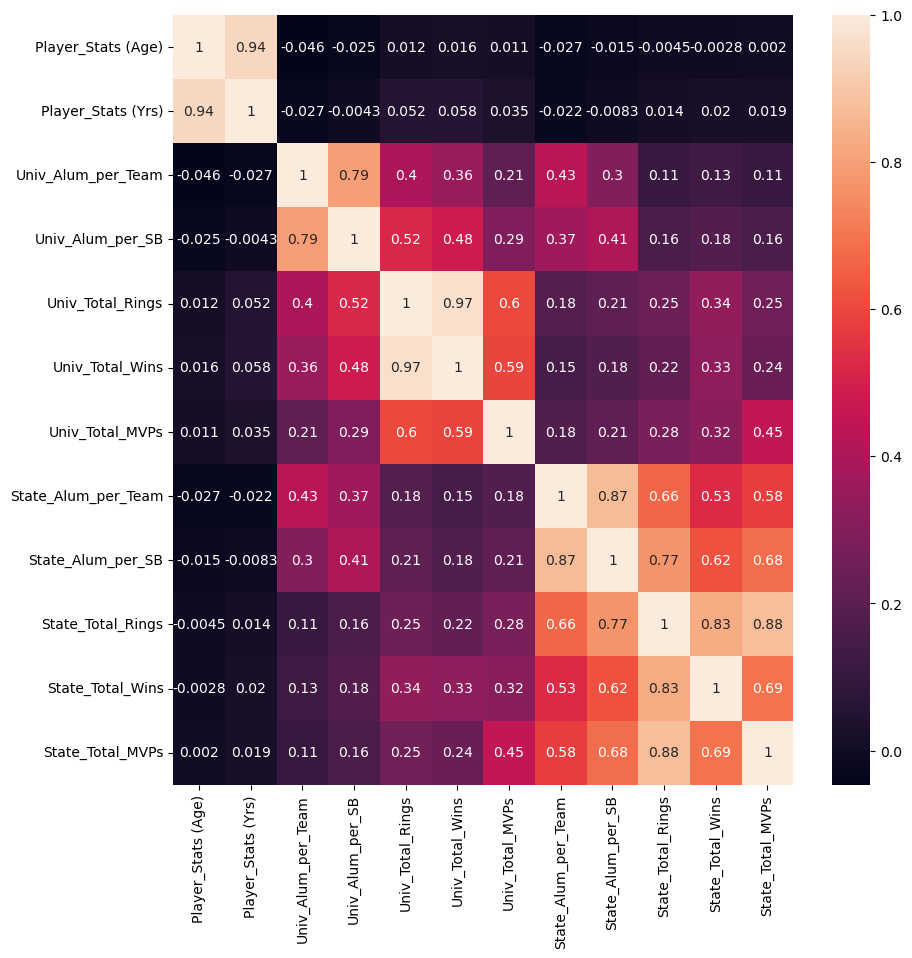

In [56]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(10,10))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr_der_cols = sns.heatmap(df_sbs_der_cols.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

### No intersting or unknown correlations
#### I will create 5 new cols: 1) Total players on team, 2) Total wins by team, 3) % of alum per team (need total players on team to derive), 4) Ave. player age per team, 5) Ave. player yrs per team
#### - see Task 6.2 column derivations

In [57]:
# import v5 with new derivated cols

df_sbs_v5 = pd.read_pickle(os.path.join(path, '02 Data','Prepared Data', 'df_sbs_v5.pkl'))

In [58]:
# check df

df_sbs_v5.shape

(6538, 85)

In [59]:
df_sbs_v5.head()

,Player_Stats (Tm),Player_Stats (SB),Player_Stats (Key),Player_Stats (Player),Player_Stats (No.),Player_Stats (Age)_x,Player_Stats (Pos),Player_Stats (College/Univ),Player_Stats (Univ_State),Player_Stats (BirthDate),Player_Stats (Yrs)_x,Player_Stats (Super_bowl),Player_Stats (Team),Player_Stats (Pts),Player_Stats (MVP),Player_Stats (Stadium),Player_Stats (City),Player_Stats (State),Player_Stats (Date),Player_Stats (W/L),O_Passing (Cmp),O_Passing (Att),O_Passing (Yds),O_Passing (TD),O_Passing (Int),O_Passing (Sk),O_Passing (Yds.1),O_Passing (Lng),O_Passing (Rate),O_Rushing (Att),O_Rushing (Yds),O_Rushing (TD),O_Rushing (Lng),O_Receiving (Rec),O_Receiving (Yds),O_Receiving (TD),O_Receiving (Lng),O_Fumbles (Fmb),O_Fumbles (FL),D_Interceptions (Int),D_Interceptions (Yds),D_Interceptions (TD),D_Interceptions (Lng),D_Sacks (Sk),D_Tackles (Comb),D_Tackles (Solo),D_Tackles (Ast),D_Fumbles (FR),D_Fumbles (Yds),D_Fumbles (TD),D_Fumbles (FF),SPT_Kick_Returns (Rt),SPT_Kick_Returns (Yds),SPT_Kick_Returns (Y/Rt),SPT_Kick_Returns (TD),SPT_Kick_Returns (Lng),SPT_Punt_Returns (Ret),SPT_Punt_Returns (Yds),SPT_Punt_Returns (Y/R),SPT_Punt_Returns (TD),SPT_Punt_Returns (Lng),SPT_Scoring (XPM),SPT_Scoring (XPA),SPT_Scoring (FGM),SPT_Scoring (FGA),SPT_Punting (Pnt),SPT_Punting (Yds),SPT_Punting (Y/P),SPT_Punting (Lng),Unique_Key,Univ_Alum_per_Team,Univ_Alum_per_SB,Univ_Total_Rings,Univ_Total_Wins,Univ_Total_MVPs,State_Alum_per_Team,State_Alum_per_SB,State_Total_Rings,State_Total_Wins,State_Total_MVPs,Total_Wins_by_Team,Total_#_of_players,Alum_%,Avg_Player_Age_by_Team,Avg_Player_Yrs_by_Team
0,ARI,43,ARI43,Aaron Francisco,47,25,DB,BYU,UT,7/5/1983,3,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,ARI43Aaron Francisco,1.0,3.0,40.0,31.0,3.0,1.0,4.0,77.0,43.0,3.0,0.0,54,1.85,27.3,4.17
1,ARI,43,ARI43,Adrian Wilson,24,29,SS,North Carolina St.,NC,10/12/1979,7,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,7,7,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,ARI43Adrian Wilson,1.0,1.0,22.0,19.0,0.0,1.0,5.0,123.0,50.0,0.0,0.0,54,1.85,27.3,4.17
2,ARI,43,ARI43,Alan Branch,78,24,DT,Michigan,MI,12/29/1984,1,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,ARI43Alan Branch,5.0,7.0,62.0,43.0,11.0,5.0,7.0,128.0,53.0,11.0,0.0,54,9.26,27.3,4.17
3,ARI,43,ARI43,Gabe Watson,98,25,DT,Michigan,MI,9/24/1983,2,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,ARI43Gabe Watson,5.0,7.0,62.0,43.0,11.0,5.0,7.0,128.0,53.0,11.0,0.0,54,9.26,27.3,4.17
4,ARI,43,ARI43,Jerame Tuman,84,32,TE,Michigan,MI,3/24/1976,9,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,ARI43Jerame Tuman,5.0,7.0,62.0,43.0,11.0,5.0,7.0,128.0,53.0,11.0,0.0,54,9.26,27.3,4.17


>### Create new heatmap with new cols

In [60]:
df_sbs_new_cols = df_sbs_v5[['Total_Wins_by_Team', 'Alum_%', 'Avg_Player_Age_by_Team', 'Avg_Player_Yrs_by_Team']].copy()

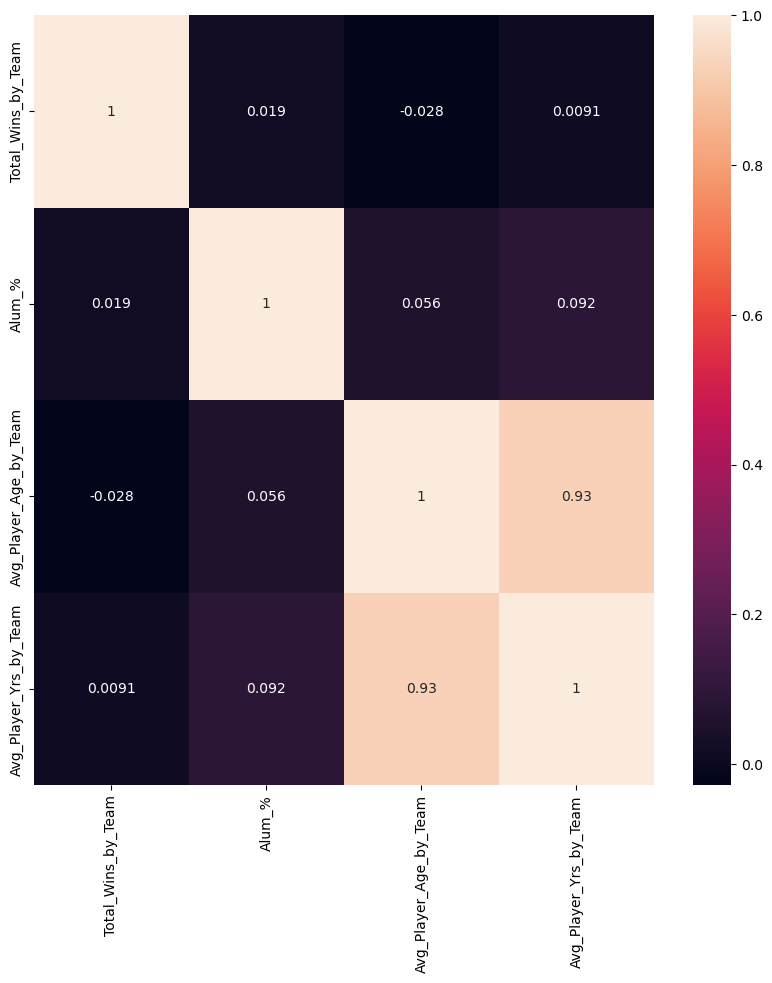

In [61]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(10,10))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr_new_cols = sns.heatmap(df_sbs_new_cols.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

### Again, no meaningful correlaions found

### Try using total points scored with offensive stats, defensive stats, spt stats, and new derived cols stats

In [62]:
# create sub df

df_pts_off = df_sbs_v5[['Player_Stats (Pts)', 'O_Passing (Cmp)', 'O_Passing (Yds)', 'O_Passing (Int)', 'O_Passing (Sk)', 'O_Passing (Yds.1)', 'O_Rushing (Yds)', 'O_Receiving (Rec)', 'O_Fumbles (FL)']].copy()

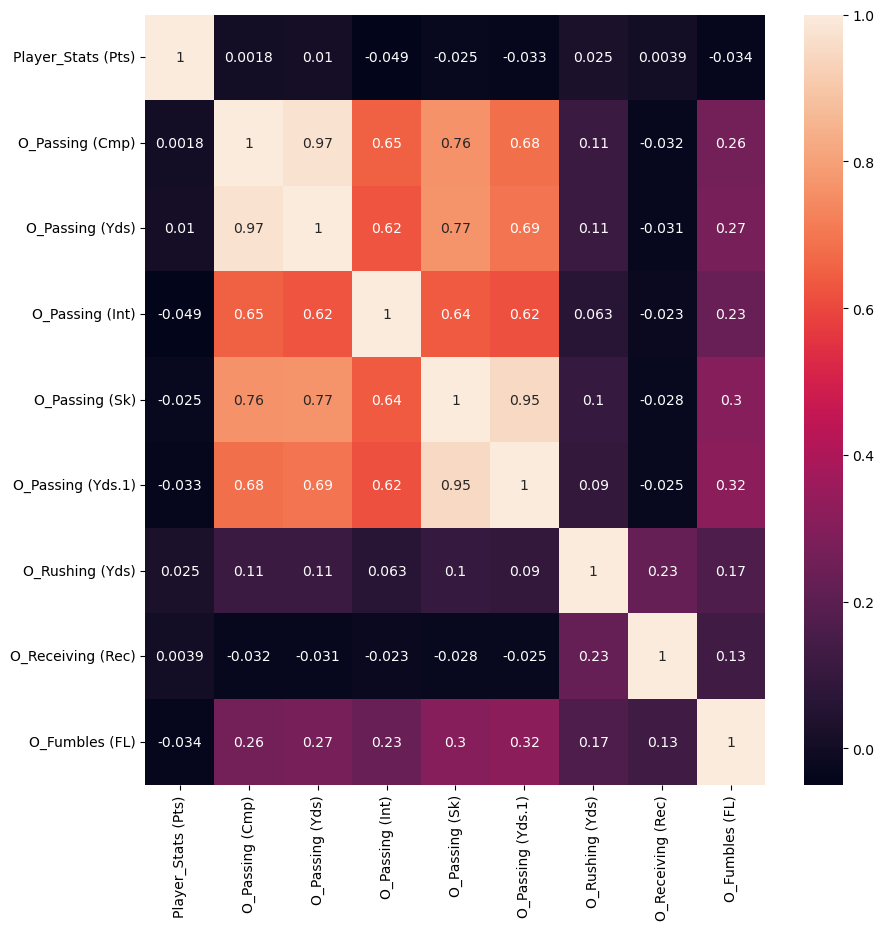

In [63]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(10,10))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr_pts_off = sns.heatmap(df_pts_off.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

### Defensive stats

In [64]:
# create sub df

df_pts_def = df_sbs_v5[['Player_Stats (Pts)', 'D_Interceptions (Int)', 'D_Interceptions (Yds)', 'D_Sacks (Sk)', 'D_Fumbles (FR)', 'D_Fumbles (FF)']].copy()

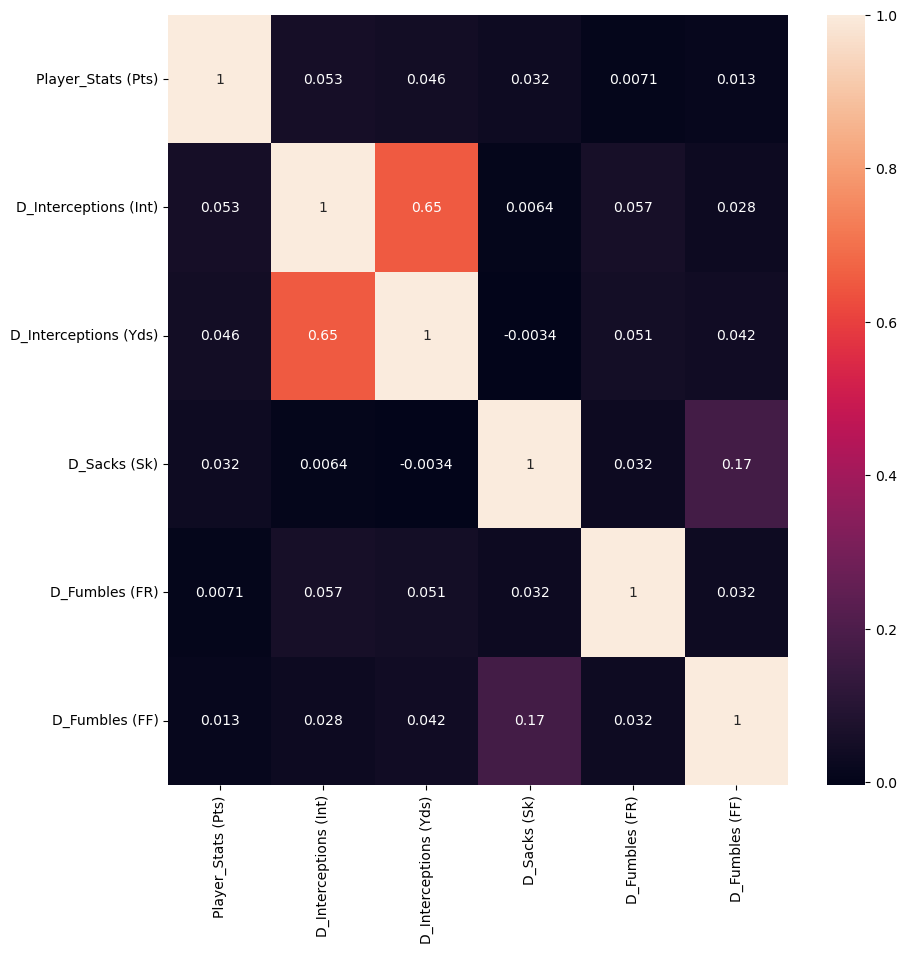

In [65]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(10,10))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr_pts_def = sns.heatmap(df_pts_def.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

### SPT stats

In [66]:
# create sub df

df_pts_spt = df_sbs_v5[['Player_Stats (Pts)', 'SPT_Kick_Returns (Yds)', 'SPT_Kick_Returns (Y/Rt)', 'SPT_Punt_Returns (Yds)', 'SPT_Punt_Returns (Y/R)', 'SPT_Scoring (FGA)', 'SPT_Punting (Y/P)']].copy()

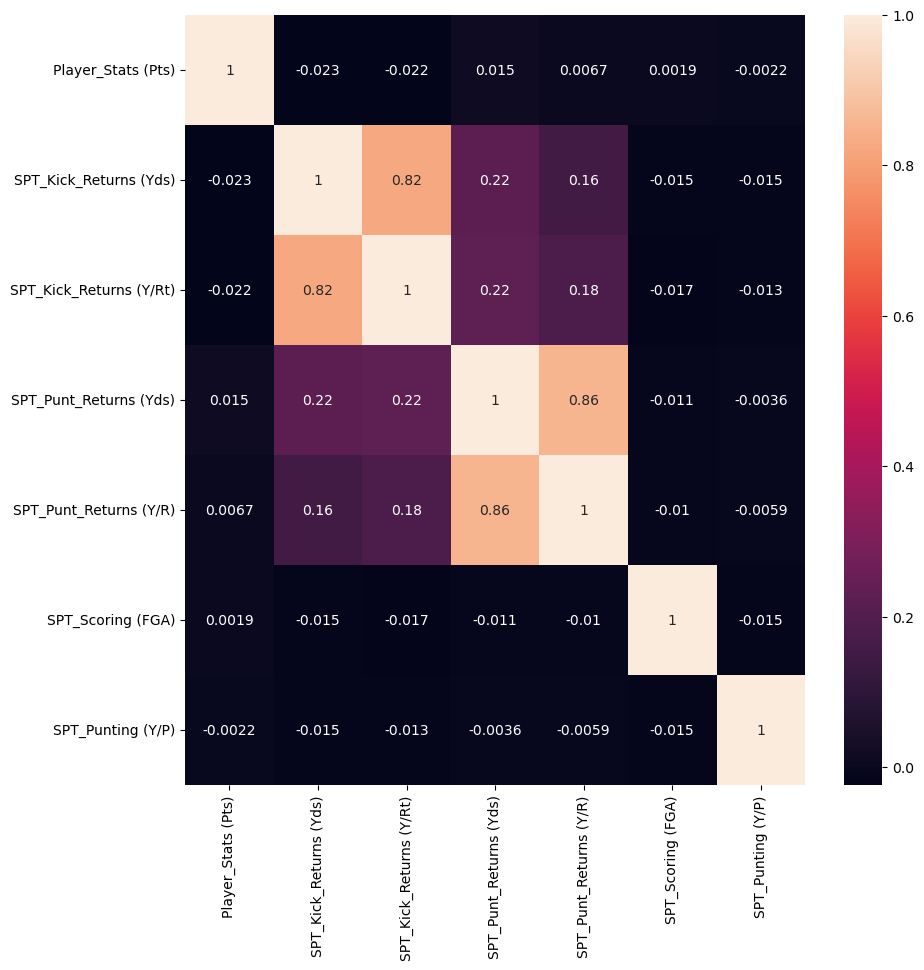

In [67]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(10,10))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr_pts_spt = sns.heatmap(df_pts_spt.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

### Still no correlations found

### Need to aggregate all stats to find team totals, then make new heatmaps
#### see 6.2 column derivations script

In [68]:
# import v6 with new derivated team cols

df_sbs_v6 = pd.read_pickle(os.path.join(path, '02 Data','Prepared Data', 'df_sbs_v6.pkl'))

In [69]:
# check df

df_sbs_v6.head()

,Player_Stats (Tm),Player_Stats (SB),Player_Stats (Key),Player_Stats (Player),Player_Stats (No.),Player_Stats (Age)_x,Player_Stats (Pos),Player_Stats (College/Univ),Player_Stats (Univ_State),Player_Stats (BirthDate),Player_Stats (Yrs)_x,Player_Stats (Super_bowl),Player_Stats (Team),Player_Stats (Pts),Player_Stats (MVP),Player_Stats (Stadium),Player_Stats (City),Player_Stats (State),Player_Stats (Date),Player_Stats (W/L),O_Passing (Cmp),O_Passing (Att),O_Passing (Yds),O_Passing (TD),O_Passing (Int),O_Passing (Sk),O_Passing (Yds.1),O_Passing (Lng),O_Passing (Rate),O_Rushing (Att),O_Rushing (Yds),O_Rushing (TD),O_Rushing (Lng),O_Receiving (Rec),O_Receiving (Yds),O_Receiving (TD),O_Receiving (Lng),O_Fumbles (Fmb),O_Fumbles (FL),D_Interceptions (Int),D_Interceptions (Yds),D_Interceptions (TD),D_Interceptions (Lng),D_Sacks (Sk),D_Tackles (Comb),D_Tackles (Solo),D_Tackles (Ast),D_Fumbles (FR),D_Fumbles (Yds),D_Fumbles (TD),D_Fumbles (FF),SPT_Kick_Returns (Rt),SPT_Kick_Returns (Yds),SPT_Kick_Returns (Y/Rt),SPT_Kick_Returns (TD),SPT_Kick_Returns (Lng),SPT_Punt_Returns (Ret),SPT_Punt_Returns (Yds),SPT_Punt_Returns (Y/R),SPT_Punt_Returns (TD),SPT_Punt_Returns (Lng),SPT_Scoring (XPM),SPT_Scoring (XPA),SPT_Scoring (FGM),SPT_Scoring (FGA),SPT_Punting (Pnt),SPT_Punting (Yds),SPT_Punting (Y/P),SPT_Punting (Lng),Unique_Key,Univ_Alum_per_Team,Univ_Alum_per_SB,Univ_Total_Rings,Univ_Total_Wins,Univ_Total_MVPs,State_Alum_per_Team,State_Alum_per_SB,State_Total_Rings,State_Total_Wins,State_Total_MVPs,Total_Wins_by_Team,Total_#_of_players,Alum_%,Avg_Player_Age_by_Team,Avg_Player_Yrs_by_Team,TEAM_O_Passing (Cmp),TEAM_O_Passing (Att),TEAM_O_Passing (Yds),TEAM_O_Passing (TD),TEAM_O_Passing (Int),TEAM_O_Passing (Sk),TEAM_O_Passing (Yds.1),TEAM_O_Passing (Lng),TEAM_O_Passing (Rate),TEAM_O_Rushing (Att),TEAM_O_Rushing (Yds),TEAM_O_Rushing (TD),TEAM_O_Rushing (Lng),TEAM_O_Receiving (Rec),TEAM_O_Receiving (Yds),TEAM_O_Receiving (TD),TEAM_O_Receiving (Lng),TEAM_O_Fumbles (Fmb),TEAM_O_Fumbles (FL),TEAM_D_Interceptions (Int),TEAM_D_Interceptions (Yds),TEAM_D_Interceptions (TD),TEAM_D_Interceptions (Lng),TEAM_D_Sacks (Sk),TEAM_D_Tackles (Comb),TEAM_D_Tackles (Solo),TEAM_D_Tackles (Ast),TEAM_D_Fumbles (FR),TEAM_D_Fumbles (Yds),TEAM_D_Fumbles (TD),TEAM_D_Fumbles (FF),TEAM_SPT_Kick_Returns (Rt),TEAM_SPT_Kick_Returns (Yds),TEAM_SPT_Kick_Returns (Y/Rt),TEAM_SPT_Kick_Returns (TD),TEAM_SPT_Kick_Returns (Lng),TEAM_SPT_Punt_Returns (Ret),TEAM_SPT_Punt_Returns (Yds),TEAM_SPT_Punt_Returns (Y/R),TEAM_SPT_Punt_Returns (TD),TEAM_SPT_Punt_Returns (Lng),TEAM_SPT_Scoring (XPM),TEAM_SPT_Scoring (XPA),TEAM_SPT_Scoring (FGM),TEAM_SPT_Scoring (FGA),TEAM_SPT_Punting (Pnt),TEAM_SPT_Punting (Yds),TEAM_SPT_Punting (Y/P),TEAM_SPT_Punting (Lng),Rush_Att_Category
0,ARI,43,ARI43,Aaron Francisco,47,25,DB,BYU,UT,7/5/1983,3,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,ARI43Aaron Francisco,1.0,3.0,40.0,31.0,3.0,1.0,4.0,77.0,43.0,3.0,0.0,54,1.85,27.3,4.17,31,43,377,3,1,2,3,64,112.3,12,33,0,9,31,377,3,194,2,1,1,-1,0,-1,3.0,66,52,14,1,0,0,0,5,91,29.5,0,32,2,34,17.0,0,34,3,3,0,0,5,180,36.0,45,Low Rush Att
1,ARI,43,ARI43,Adrian Wilson,24,29,SS,North Carolina St.,NC,10/12/1979,7,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,7,7,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,ARI43Adrian Wilson,1.0,1.0,22.0,19.0,0.0,1.0,5.0,123.0,50.0,0.0,0.0,54,1.85,27.3,4.17,31,43,377,3,1,2,3,64,112.3,12,33,0,9,31,377,3,194,2,1,1,-1,0,-1,3.0,66,52,14,1,0,0,0,5,91,29.5,0,32,2,34,17.0,0,34,3,3,0,0,5,180,36.0,45,Low Rush Att
2,ARI,43,ARI43,Alan Branch,78,24,DT,Michigan,MI,12/29/1984,1,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0

In [70]:
df_sbs_v6.shape

(6538, 135)

In [71]:
# create sub df

df_team_stats = df_sbs_v6[['Player_Stats (Key)', 'Player_Stats (Pts)', 'Avg_Player_Age_by_Team', 'Avg_Player_Yrs_by_Team', 'Univ_Alum_per_Team', 'Alum_%', 'TEAM_O_Passing (Cmp)', 'TEAM_O_Passing (Att)', 'TEAM_O_Passing (Yds)', 'TEAM_O_Passing (TD)', 'TEAM_O_Passing (Int)', 'TEAM_O_Passing (Sk)', 'TEAM_O_Passing (Yds.1)', 'TEAM_O_Passing (Lng)', 'TEAM_O_Passing (Rate)', 'TEAM_O_Rushing (Att)', 'TEAM_O_Rushing (Yds)', 'TEAM_O_Rushing (TD)', 'TEAM_O_Rushing (Lng)', 'TEAM_O_Receiving (Rec)', 'TEAM_O_Receiving (Yds)', 'TEAM_O_Receiving (TD)', 'TEAM_O_Receiving (Lng)', 'TEAM_O_Fumbles (Fmb)', 'TEAM_O_Fumbles (FL)', 'TEAM_D_Interceptions (Int)', 'TEAM_D_Interceptions (Yds)', 'TEAM_D_Interceptions (TD)', 'TEAM_D_Interceptions (Lng)', 'TEAM_D_Sacks (Sk)', 'TEAM_D_Tackles (Comb)', 'TEAM_D_Tackles (Solo)', 'TEAM_D_Tackles (Ast)', 'TEAM_D_Fumbles (FR)', 'TEAM_D_Fumbles (Yds)', 'TEAM_D_Fumbles (TD)', 'TEAM_D_Fumbles (FF)', 'TEAM_SPT_Kick_Returns (Rt)', 'TEAM_SPT_Kick_Returns (Yds)', 'TEAM_SPT_Kick_Returns (Y/Rt)', 'TEAM_SPT_Kick_Returns (TD)', 'TEAM_SPT_Kick_Returns (Lng)', 'TEAM_SPT_Punt_Returns (Ret)', 'TEAM_SPT_Punt_Returns (Yds)', 'TEAM_SPT_Punt_Returns (Y/R)', 'TEAM_SPT_Punt_Returns (TD)', 'TEAM_SPT_Punt_Returns (Lng)', 'TEAM_SPT_Scoring (XPM)', 'TEAM_SPT_Scoring (XPA)', 'TEAM_SPT_Scoring (FGM)', 'TEAM_SPT_Scoring (FGA)', 'TEAM_SPT_Punting (Pnt)', 'TEAM_SPT_Punting (Yds)', 'TEAM_SPT_Punting (Y/P)', 'TEAM_SPT_Punting (Lng)']].copy()

In [72]:
# check sub df

df_team_stats.shape

(6538, 55)

In [73]:
# Remove duplicates from the sub dataframe

df_team_stats = df_team_stats.drop_duplicates()

In [74]:
# check result

df_team_stats.shape

(393, 55)

In [75]:
# drop Key column

df_team_stats = df_team_stats.drop('Player_Stats (Key)', axis=1)

In [76]:
# check result

df_team_stats.head()

,Player_Stats (Pts),Avg_Player_Age_by_Team,Avg_Player_Yrs_by_Team,Univ_Alum_per_Team,Alum_%,TEAM_O_Passing (Cmp),TEAM_O_Passing (Att),TEAM_O_Passing (Yds),TEAM_O_Passing (TD),TEAM_O_Passing (Int),TEAM_O_Passing (Sk),TEAM_O_Passing (Yds.1),TEAM_O_Passing (Lng),TEAM_O_Passing (Rate),TEAM_O_Rushing (Att),TEAM_O_Rushing (Yds),TEAM_O_Rushing (TD),TEAM_O_Rushing (Lng),TEAM_O_Receiving (Rec),TEAM_O_Receiving (Yds),TEAM_O_Receiving (TD),TEAM_O_Receiving (Lng),TEAM_O_Fumbles (Fmb),TEAM_O_Fumbles (FL),TEAM_D_Interceptions (Int),TEAM_D_Interceptions (Yds),TEAM_D_Interceptions (TD),TEAM_D_Interceptions (Lng),TEAM_D_Sacks (Sk),TEAM_D_Tackles (Comb),TEAM_D_Tackles (Solo),TEAM_D_Tackles (Ast),TEAM_D_Fumbles (FR),TEAM_D_Fumbles (Yds),TEAM_D_Fumbles (TD),TEAM_D_Fumbles (FF),TEAM_SPT_Kick_Returns (Rt),TEAM_SPT_Kick_Returns (Yds),TEAM_SPT_Kick_Returns (Y/Rt),TEAM_SPT_Kick_Returns (TD),TEAM_SPT_Kick_Returns (Lng),TEAM_SPT_Punt_Returns (Ret),TEAM_SPT_Punt_Returns (Yds),TEAM_SPT_Punt_Returns (Y/R),TEAM_SPT_Punt_Returns (TD),TEAM_SPT_Punt_Returns (Lng),TEAM_SPT_Scoring (XPM),TEAM_SPT_Scoring (XPA),TEAM_SPT_Scoring (FGM),TEAM_SPT_Scoring (FGA),TEAM_SPT_Punting (Pnt),TEAM_SPT_Punting (Yds),TEAM_SPT_Punting (Y/P),TEAM_SPT_Punting (Lng)
0,23,27.30,4.17,1.0,1.85,31,43,377,3,1,2,3,64,112.3,12,33,0,9,31,377,3,194,2,1,1,-1,0,-1,3.0,66,52,14,1,0,0,0,5,91,29.5,0,32,2,34,17.0,0,34,3,3,0,0,5,180,36.0,45
2,23,27.30,4.17,5.0,9.26,31,43,377,3,1,2,3,64,112.3,12,33,0,9,31,377,3,194,2,1,1,-1,0,-1,3.0,66,52,14,1,0,0,0,5,91,29.5,0,32,2,34,17.0,0,34,3,3,0,0,5,180,36.0,45
7,23,27.30,4.17,2.0,3.70,31,43,377,3,1,2,3,64,112.3,12,33,0,9,31,377,3,194,2,1,1,-1,0,-1,3.0,66,52,14,1,0,0,0,5,91,29.5,0,32,2,34,17.0,0,34,3,3,0,0,5,180,36.0,45
12,23,27.30,4.17,3.0,5.56,31,43,377,3,1,2,3,64,112.3,12,33,0,9,31,377,3,194,2,1,1,-1,0,-1,3.0,66,52,14,1,0,0,0,5,91,29.5,0,32,2,34,17.0,0,34,3,3,0,0,5,180,36.0,45
54,27,27.18,4.07,2.0,3.33,21,30,256,1,1,3,22,40,93.2,25,58,1,26,21,256,1,124,0,0,1,100,1,100,2.0,64,47,17,1,0,0,1,4,80,40.0,0,45,2,5,2.5,0,4,3,3,2,2,3,139,46.3,49


### Team Off stats

In [77]:
# create sub df

df_team_off = df_team_stats[['Player_Stats (Pts)', 'Avg_Player_Age_by_Team', 'Avg_Player_Yrs_by_Team', 'Univ_Alum_per_Team', 'Alum_%', 'TEAM_O_Passing (Cmp)', 'TEAM_O_Passing (Att)', 'TEAM_O_Passing (Yds)', 'TEAM_O_Passing (Int)', 'TEAM_O_Passing (Sk)', 'TEAM_O_Passing (Yds.1)', 'TEAM_O_Rushing (Att)', 'TEAM_O_Rushing (Yds)', 'TEAM_O_Receiving (Rec)', 'TEAM_O_Fumbles (FL)']].copy()

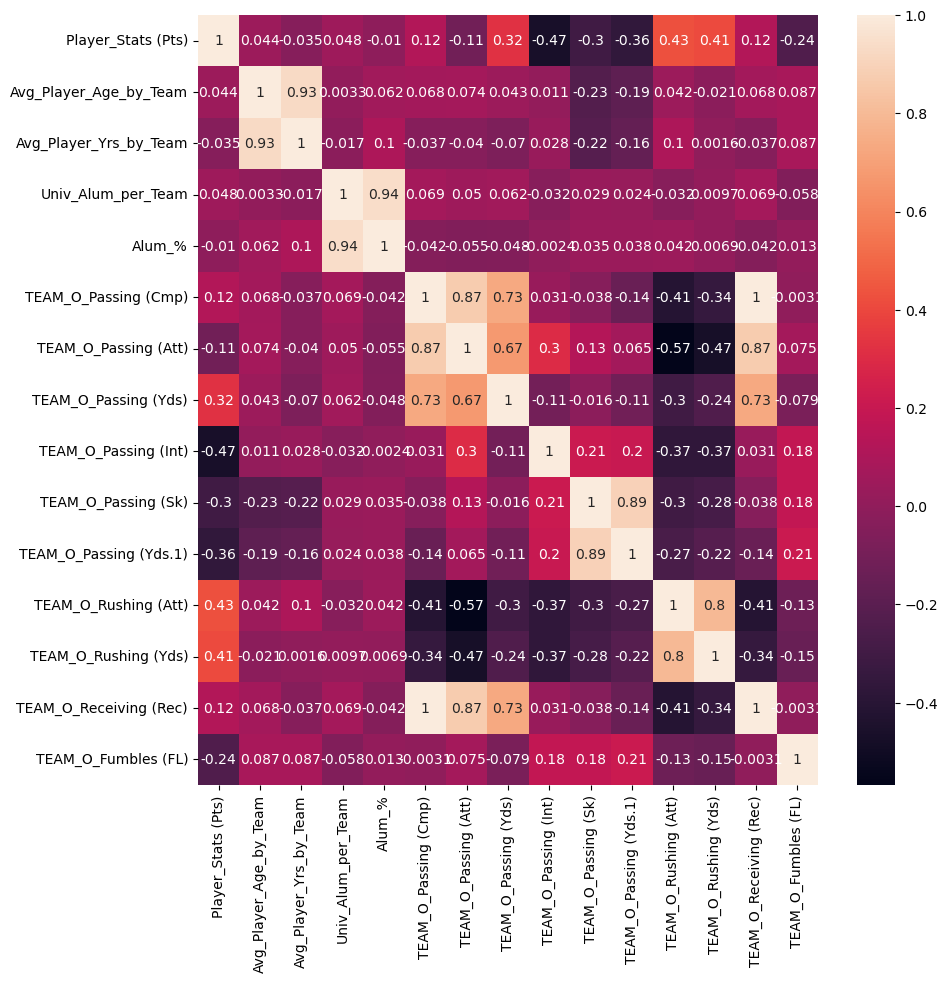

In [78]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(10,10))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr_team_off = sns.heatmap(df_team_off.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

### Team Def Stats

In [79]:
# create sub df

df_team_def = df_sbs_v6[['Player_Stats (Pts)', 'Avg_Player_Age_by_Team', 'Avg_Player_Yrs_by_Team', 'Univ_Alum_per_Team', 'Alum_%', 'TEAM_D_Interceptions (Int)', 'TEAM_D_Interceptions (Yds)', 'TEAM_D_Sacks (Sk)', 'TEAM_D_Fumbles (FR)', 'TEAM_D_Fumbles (FF)']].copy()

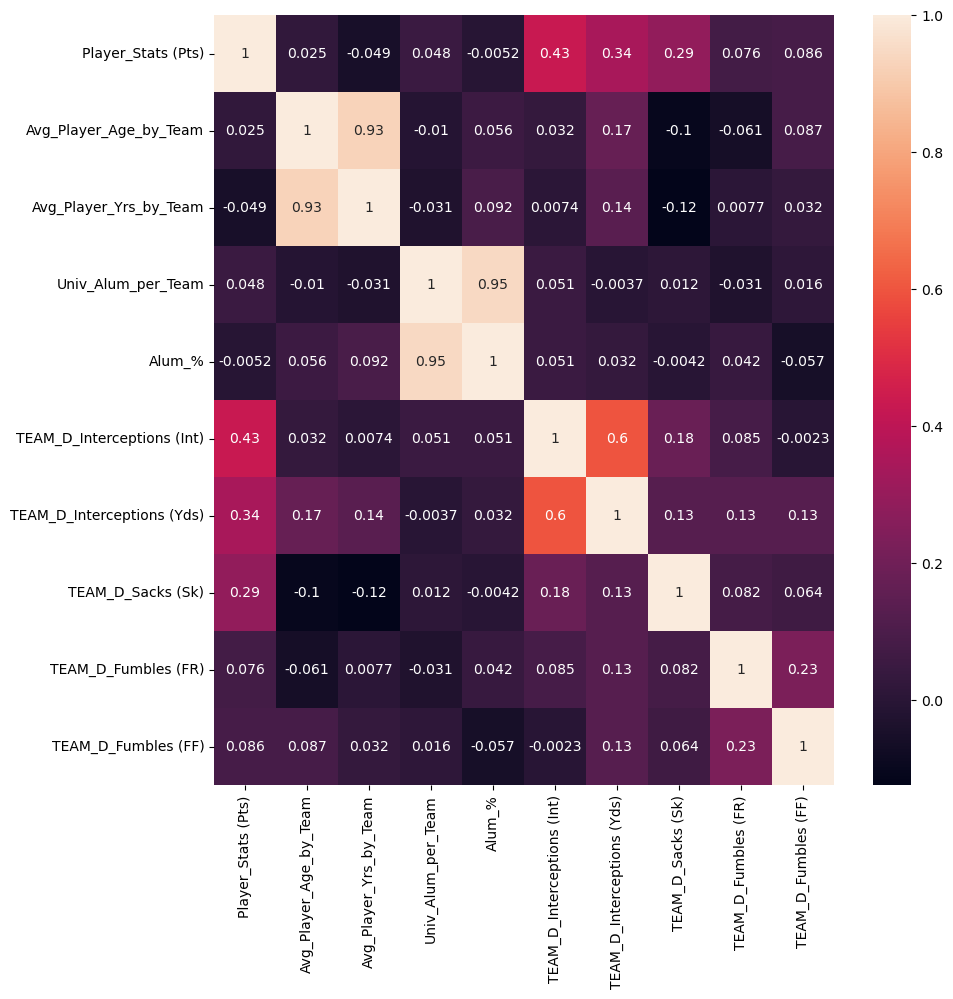

In [80]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(10,10))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr_team_def = sns.heatmap(df_team_def.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

### Team SPT Stats

In [81]:
# create sub df

df_team_spt = df_sbs_v6[['Player_Stats (Pts)', 'Avg_Player_Age_by_Team', 'Avg_Player_Yrs_by_Team', 'Univ_Alum_per_Team', 'Alum_%', 'TEAM_SPT_Kick_Returns (Yds)', 'TEAM_SPT_Kick_Returns (Y/Rt)', 'TEAM_SPT_Punt_Returns (Yds)', 'TEAM_SPT_Punt_Returns (Y/R)', 'TEAM_SPT_Scoring (FGA)', 'TEAM_SPT_Punting (Pnt)', 'TEAM_SPT_Punting (Y/P)']].copy()

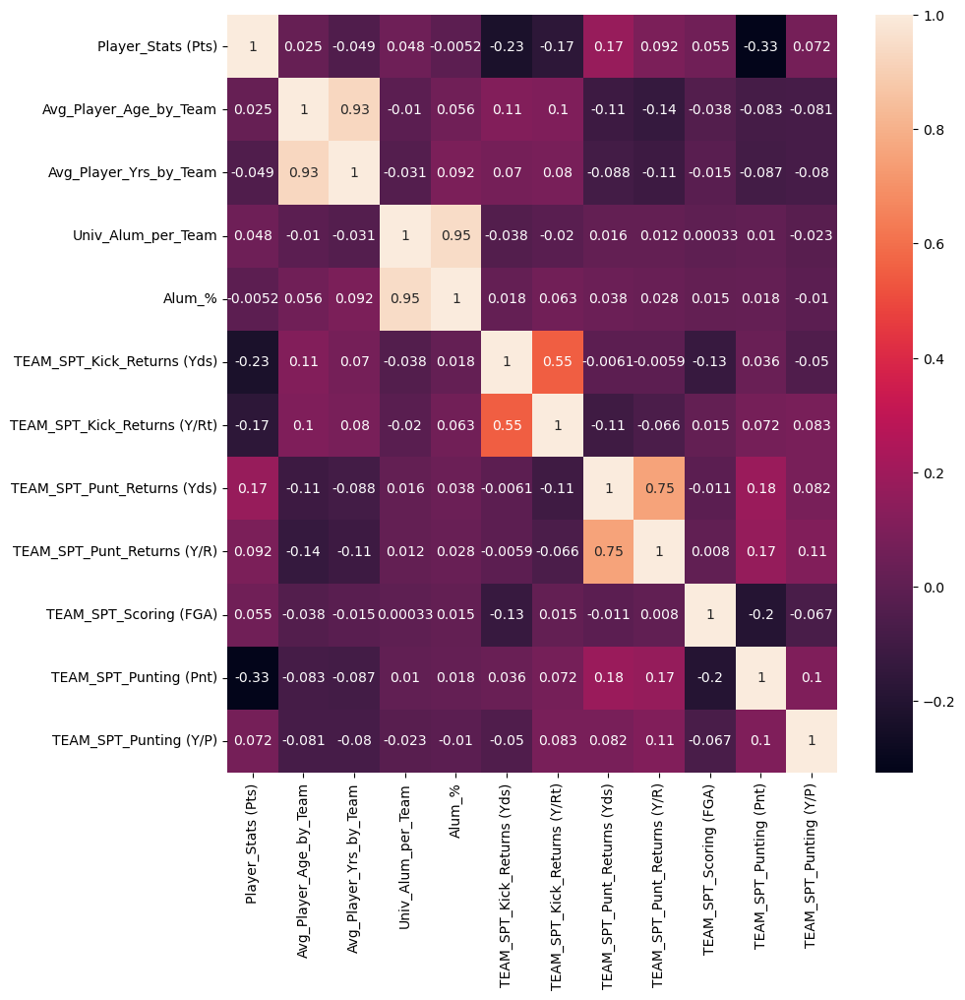

In [82]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(10,10))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr_team_spt = sns.heatmap(df_team_spt.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

## These heatmaps have shown very few correlations above 0.5 and even less below -0.5 (the positive and negative threshholds for a strong correlation). Most every correlation is of no surprise and of no worth, such as the higher number of pass completions has a very highly positive correlation with the number of passing receptions. This is obvious, as one is dependant on the other. There were, however, 3 correlations that are of some interest, but none break positive or negative threshhold.
>### 1. Rushing Attempts & Total Points Scored by a Team (0.43): medium correlation at best - the more times a team tries to run the ball, the more points they score.
>### 2. Defensive Intereptions Made & Total Points Scored by a Team (0.43) - medium correlation at best - the more interceptions the defense makes, the more points their offense scores, or at least the more opportunities they have to score.
>### 3. Passing Interceptions & Total Points Scored by a Team (-0.47) - medium-to-slightly-strong - the more times a quarterback throws an interception, the less points that team scores.
>### 4. Offensive Sacks for Loss & Total Points Scored (-0.36) - weak-to-medium - the more times a quarterback is sacked, the less points that team will score.
>### 5. Offensive Fumbles For Loss & Total Points Scored (-0.24) - weak correlation - the more times a team fumbles the ball and it's recovered by the defense, the less points they will score.

<a id='4'></a> <br>
## 4. Scatterplots

C:\Users\pjbac\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


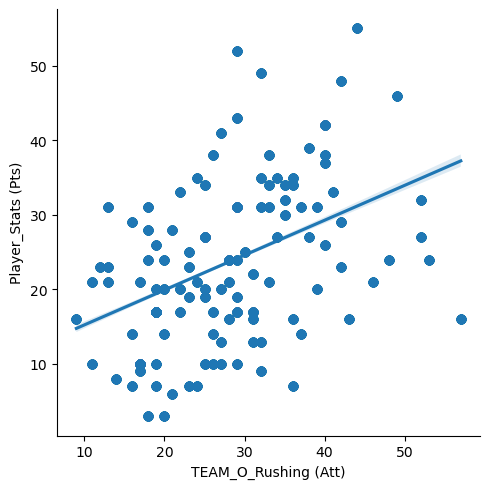

In [83]:
# Create a scatterplot for Pts and rushing attempts columns in seaborn

sns.lmplot(x = 'TEAM_O_Rushing (Att)', y = 'Player_Stats (Pts)', data = df_sbs_v6)

### While there is a clear upward trend, many data points are not clustered near the trend line. This proves that teams with higher scores in the super bowl tend to have a higher number of rush attempts, however, there are many other factors that that go into scoring - more rush attempts does not cause a team to have higher points, just more opportunities to score.

C:\Users\pjbac\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


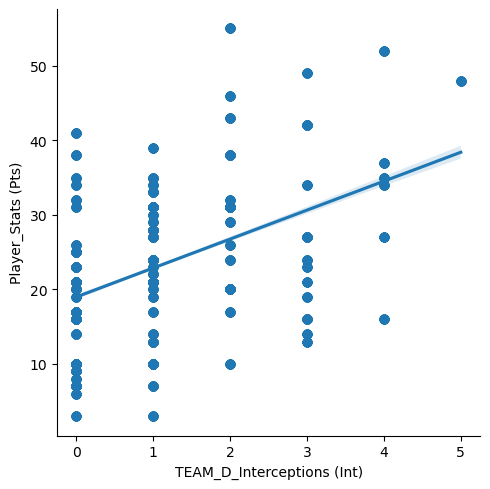

In [84]:
# Create a scatterplot for Pts and def int columns in seaborn

sns.lmplot(x = 'TEAM_D_Interceptions (Int)', y = 'Player_Stats (Pts)', data = df_sbs_v6)

### Again, there is a positive trend but many data points fall outside the trend line. In fact, of the teams with 30 points or higher, nearly 50% of them had less than 2 interceptions. While getting an interception gives your team the unexpected opportunity to score, it does not mean you will.

C:\Users\pjbac\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


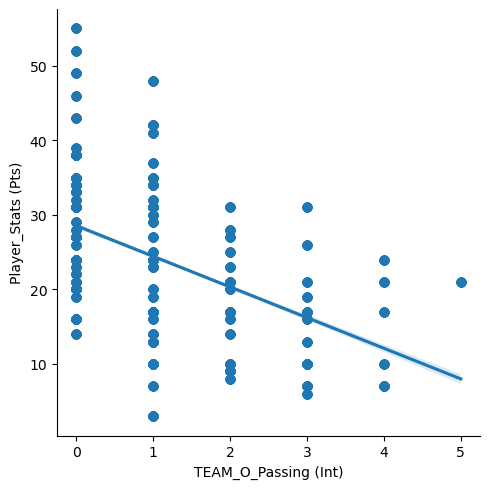

In [85]:
# Create a scatterplot for Pts and pass int columns in seaborn

sns.lmplot(x = 'TEAM_O_Passing (Int)', y = 'Player_Stats (Pts)', data = df_sbs_v6)

### Clear downward (negative) trend, but as with def int, most of the data points are far away from the trend line. In another parallel to defensive interceptions, losing the ball takes away an opportunity for your team to score, however, that doesn't mean you won't score on the next drive or at all.

C:\Users\pjbac\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


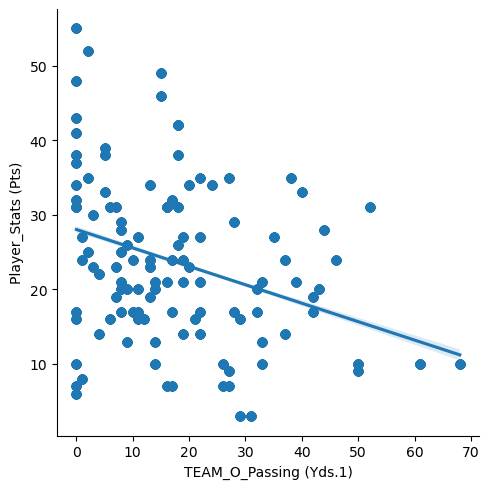

In [86]:
# Create a scatterplot for Pts and pass sacks columns in seaborn

sns.lmplot(x = 'TEAM_O_Passing (Yds.1)', y = 'Player_Stats (Pts)', data = df_sbs_v6)

### Slightly less steep trend line than the others, indicates a weaker correlation, and the number of data points away from that line weaken it more. However, the more yards that are lost, the cluster of data points get closer to the trend line, especially at 50+ yards. When the QB is sacked, it makes it that much harder for the team to score, but minor losses are easier to bounce back from. If a team can get enough sacks to cause a loss of yardage of 50 or more throughout the game, the sacked team will likely have to punt more often, giving the sacking team more time of possession on offense, which causes the the opposing defense to tire more quickly, giving them a better chance to score.

C:\Users\pjbac\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


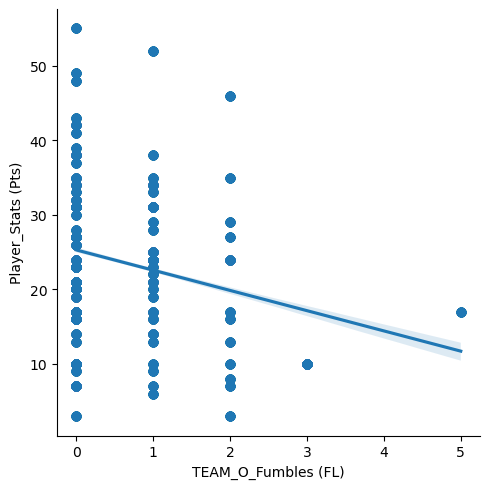

In [87]:
# Create a scatterplot for Pts and pass sacks columns in seaborn

sns.lmplot(x = 'TEAM_O_Fumbles (FL)', y = 'Player_Stats (Pts)', data = df_sbs_v6)

### By far the weakest of all the correlations I am investigating. Slight downward trend, though not very steep, and vast majority of the data points are far from the trend line. Only 2 data points are over 2 Fumbles Lost, which gives us a very narrow set of parameters to study, decreasing the possibility of finding a clear causation correlation. As with the other scatterplots, when a team turns the ball over on a fumble they lose an opportunity to score but that doesn't deter them from scoring on their next drive.

<a id='5'></a> <br>
## 5. Pair Plot
>### I will make several pair plots to see all stats

In [88]:
df_sbs_v6.head()

,Player_Stats (Tm),Player_Stats (SB),Player_Stats (Key),Player_Stats (Player),Player_Stats (No.),Player_Stats (Age)_x,Player_Stats (Pos),Player_Stats (College/Univ),Player_Stats (Univ_State),Player_Stats (BirthDate),Player_Stats (Yrs)_x,Player_Stats (Super_bowl),Player_Stats (Team),Player_Stats (Pts),Player_Stats (MVP),Player_Stats (Stadium),Player_Stats (City),Player_Stats (State),Player_Stats (Date),Player_Stats (W/L),O_Passing (Cmp),O_Passing (Att),O_Passing (Yds),O_Passing (TD),O_Passing (Int),O_Passing (Sk),O_Passing (Yds.1),O_Passing (Lng),O_Passing (Rate),O_Rushing (Att),O_Rushing (Yds),O_Rushing (TD),O_Rushing (Lng),O_Receiving (Rec),O_Receiving (Yds),O_Receiving (TD),O_Receiving (Lng),O_Fumbles (Fmb),O_Fumbles (FL),D_Interceptions (Int),D_Interceptions (Yds),D_Interceptions (TD),D_Interceptions (Lng),D_Sacks (Sk),D_Tackles (Comb),D_Tackles (Solo),D_Tackles (Ast),D_Fumbles (FR),D_Fumbles (Yds),D_Fumbles (TD),D_Fumbles (FF),SPT_Kick_Returns (Rt),SPT_Kick_Returns (Yds),SPT_Kick_Returns (Y/Rt),SPT_Kick_Returns (TD),SPT_Kick_Returns (Lng),SPT_Punt_Returns (Ret),SPT_Punt_Returns (Yds),SPT_Punt_Returns (Y/R),SPT_Punt_Returns (TD),SPT_Punt_Returns (Lng),SPT_Scoring (XPM),SPT_Scoring (XPA),SPT_Scoring (FGM),SPT_Scoring (FGA),SPT_Punting (Pnt),SPT_Punting (Yds),SPT_Punting (Y/P),SPT_Punting (Lng),Unique_Key,Univ_Alum_per_Team,Univ_Alum_per_SB,Univ_Total_Rings,Univ_Total_Wins,Univ_Total_MVPs,State_Alum_per_Team,State_Alum_per_SB,State_Total_Rings,State_Total_Wins,State_Total_MVPs,Total_Wins_by_Team,Total_#_of_players,Alum_%,Avg_Player_Age_by_Team,Avg_Player_Yrs_by_Team,TEAM_O_Passing (Cmp),TEAM_O_Passing (Att),TEAM_O_Passing (Yds),TEAM_O_Passing (TD),TEAM_O_Passing (Int),TEAM_O_Passing (Sk),TEAM_O_Passing (Yds.1),TEAM_O_Passing (Lng),TEAM_O_Passing (Rate),TEAM_O_Rushing (Att),TEAM_O_Rushing (Yds),TEAM_O_Rushing (TD),TEAM_O_Rushing (Lng),TEAM_O_Receiving (Rec),TEAM_O_Receiving (Yds),TEAM_O_Receiving (TD),TEAM_O_Receiving (Lng),TEAM_O_Fumbles (Fmb),TEAM_O_Fumbles (FL),TEAM_D_Interceptions (Int),TEAM_D_Interceptions (Yds),TEAM_D_Interceptions (TD),TEAM_D_Interceptions (Lng),TEAM_D_Sacks (Sk),TEAM_D_Tackles (Comb),TEAM_D_Tackles (Solo),TEAM_D_Tackles (Ast),TEAM_D_Fumbles (FR),TEAM_D_Fumbles (Yds),TEAM_D_Fumbles (TD),TEAM_D_Fumbles (FF),TEAM_SPT_Kick_Returns (Rt),TEAM_SPT_Kick_Returns (Yds),TEAM_SPT_Kick_Returns (Y/Rt),TEAM_SPT_Kick_Returns (TD),TEAM_SPT_Kick_Returns (Lng),TEAM_SPT_Punt_Returns (Ret),TEAM_SPT_Punt_Returns (Yds),TEAM_SPT_Punt_Returns (Y/R),TEAM_SPT_Punt_Returns (TD),TEAM_SPT_Punt_Returns (Lng),TEAM_SPT_Scoring (XPM),TEAM_SPT_Scoring (XPA),TEAM_SPT_Scoring (FGM),TEAM_SPT_Scoring (FGA),TEAM_SPT_Punting (Pnt),TEAM_SPT_Punting (Yds),TEAM_SPT_Punting (Y/P),TEAM_SPT_Punting (Lng),Rush_Att_Category
0,ARI,43,ARI43,Aaron Francisco,47,25,DB,BYU,UT,7/5/1983,3,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,ARI43Aaron Francisco,1.0,3.0,40.0,31.0,3.0,1.0,4.0,77.0,43.0,3.0,0.0,54,1.85,27.3,4.17,31,43,377,3,1,2,3,64,112.3,12,33,0,9,31,377,3,194,2,1,1,-1,0,-1,3.0,66,52,14,1,0,0,0,5,91,29.5,0,32,2,34,17.0,0,34,3,3,0,0,5,180,36.0,45,Low Rush Att
1,ARI,43,ARI43,Adrian Wilson,24,29,SS,North Carolina St.,NC,10/12/1979,7,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,7,7,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,ARI43Adrian Wilson,1.0,1.0,22.0,19.0,0.0,1.0,5.0,123.0,50.0,0.0,0.0,54,1.85,27.3,4.17,31,43,377,3,1,2,3,64,112.3,12,33,0,9,31,377,3,194,2,1,1,-1,0,-1,3.0,66,52,14,1,0,0,0,5,91,29.5,0,32,2,34,17.0,0,34,3,3,0,0,5,180,36.0,45,Low Rush Att
2,ARI,43,ARI43,Alan Branch,78,24,DT,Michigan,MI,12/29/1984,1,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0

In [89]:
# sub 10

sbs_sub_pair_10 = df_sbs_v6[['Player_Stats (Pts)', 'Avg_Player_Age_by_Team', 'Avg_Player_Yrs_by_Team', 'Alum_%', 'TEAM_SPT_Punting (Pnt)', 'TEAM_SPT_Punting (Yds)', 'TEAM_SPT_Punting (Y/P)', 'TEAM_SPT_Punting (Lng)']]

C:\Users\pjbac\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


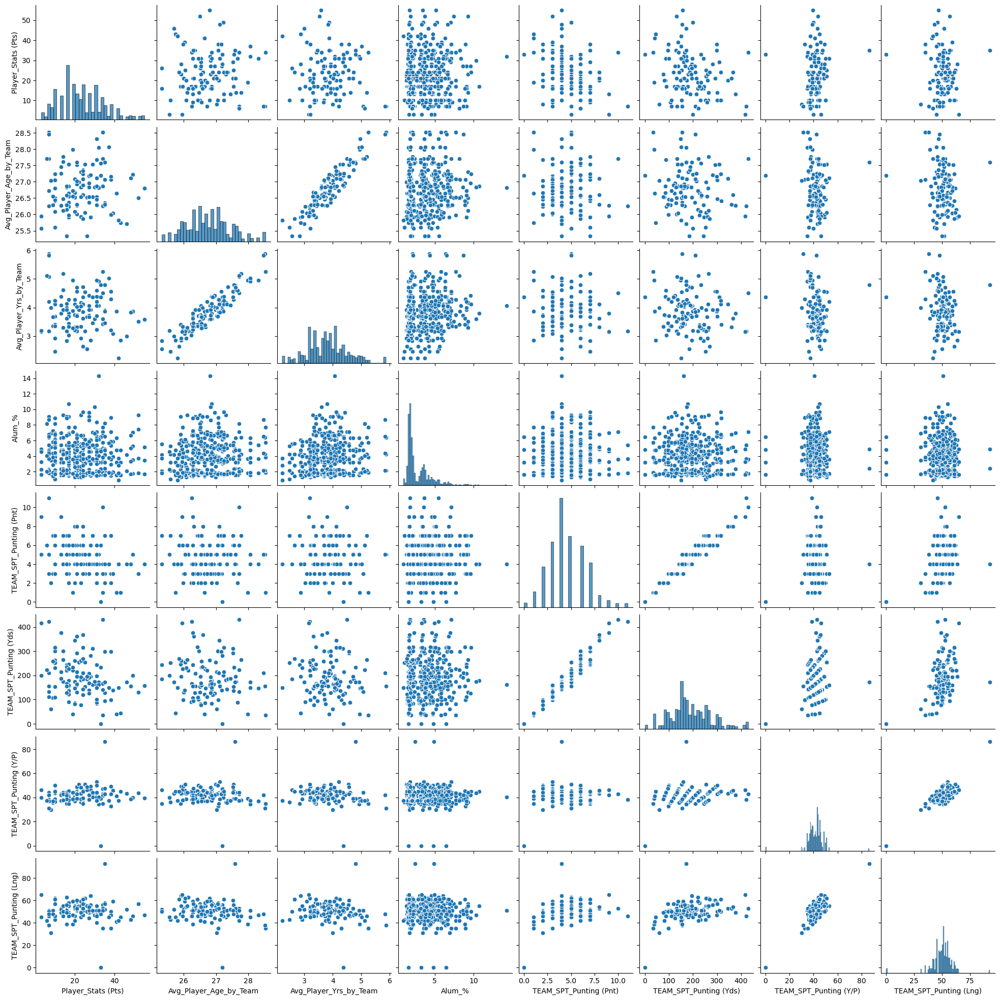

In [90]:
# Create a pair plot 

g10 = sns.pairplot(sbs_sub_pair_10)

In [91]:
# sub 9

sbs_sub_pair_9 = df_sbs_v6[['Player_Stats (Pts)', 'Avg_Player_Age_by_Team', 'Avg_Player_Yrs_by_Team', 'Alum_%', 'TEAM_SPT_Scoring (XPM)', 'TEAM_SPT_Scoring (XPA)', 'TEAM_SPT_Scoring (FGM)', 'TEAM_SPT_Scoring (FGA)']]

C:\Users\pjbac\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


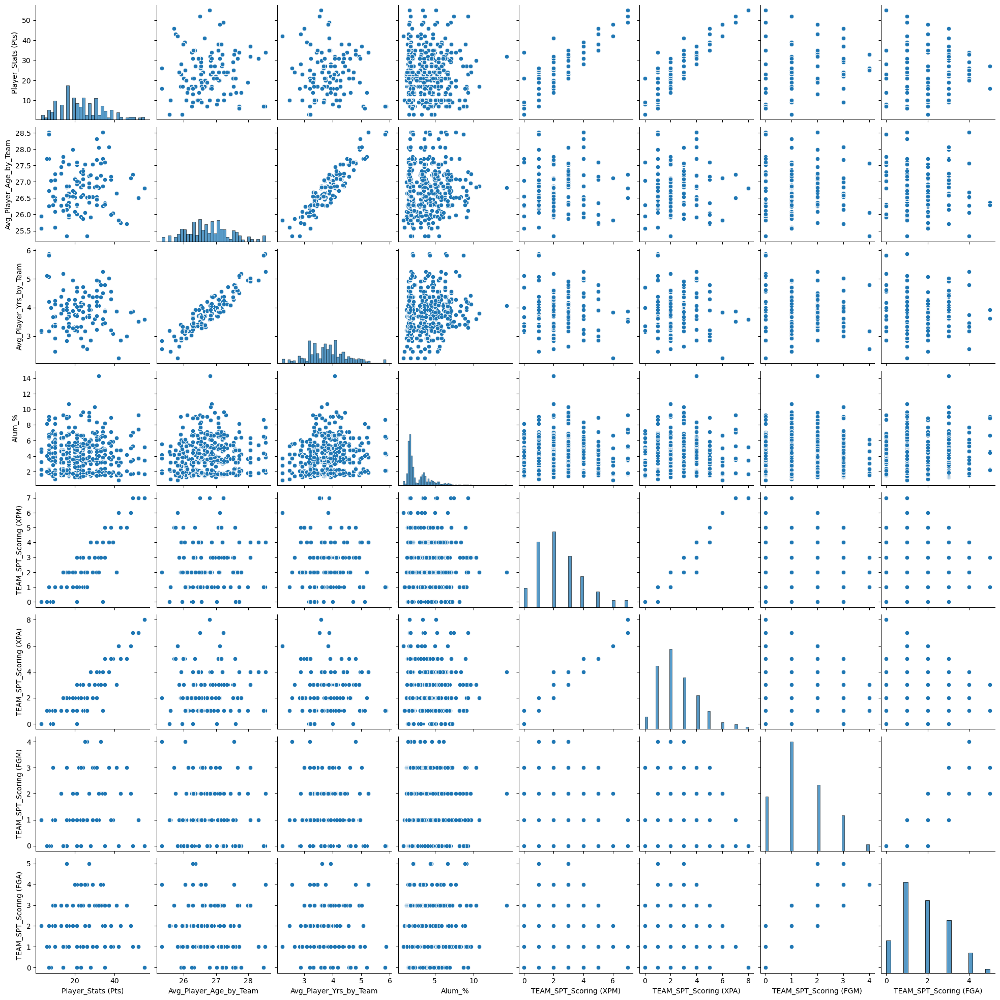

In [92]:
# Create a pair plot 

g9 = sns.pairplot(sbs_sub_pair_9)

In [93]:
# sub 8

sbs_sub_pair_8 = df_sbs_v6[['Player_Stats (Pts)', 'Avg_Player_Age_by_Team', 'Avg_Player_Yrs_by_Team', 'Alum_%', 'TEAM_SPT_Punt_Returns (Ret)', 'TEAM_SPT_Punt_Returns (Yds)', 'TEAM_SPT_Punt_Returns (Y/R)', 'TEAM_SPT_Punt_Returns (TD)', 'TEAM_SPT_Punt_Returns (Lng)']]

C:\Users\pjbac\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


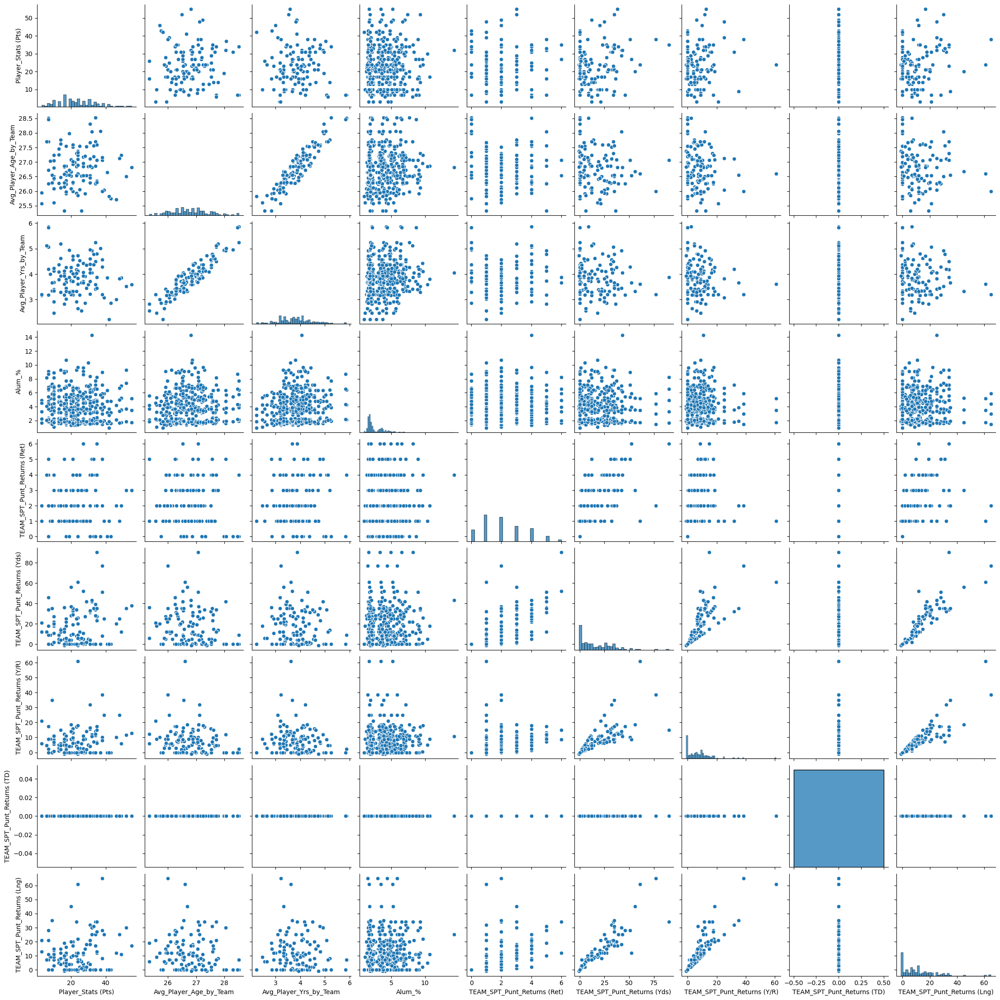

In [94]:
# Create a pair plot 

g8 = sns.pairplot(sbs_sub_pair_8)

In [95]:
# sub 7

sbs_sub_pair_7 = df_sbs_v6[['Player_Stats (Pts)', 'Avg_Player_Age_by_Team', 'Avg_Player_Yrs_by_Team', 'Alum_%', 'TEAM_SPT_Kick_Returns (Rt)', 'TEAM_SPT_Kick_Returns (Yds)', 'TEAM_SPT_Kick_Returns (Y/Rt)', 'TEAM_SPT_Kick_Returns (TD)', 'TEAM_SPT_Kick_Returns (Lng)']]

C:\Users\pjbac\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


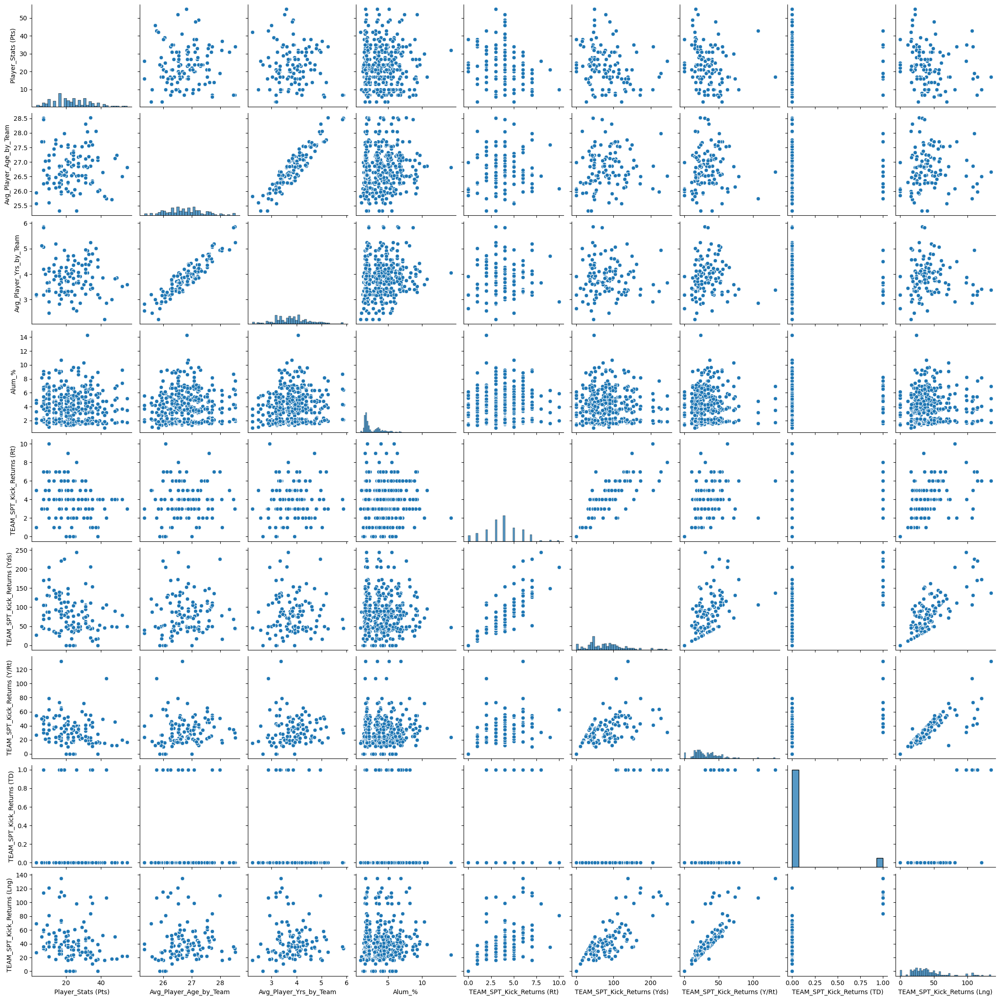

In [96]:
# Create a pair plot 

g7 = sns.pairplot(sbs_sub_pair_7)

In [97]:
# sub 6

sbs_sub_pair_6 = df_sbs_v6[['Player_Stats (Pts)', 'Avg_Player_Age_by_Team', 'Avg_Player_Yrs_by_Team', 'Alum_%', 'TEAM_D_Tackles (Ast)', 'TEAM_D_Fumbles (FR)', 'TEAM_D_Fumbles (Yds)', 'TEAM_D_Fumbles (TD)', 'TEAM_D_Fumbles (FF)']]

C:\Users\pjbac\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


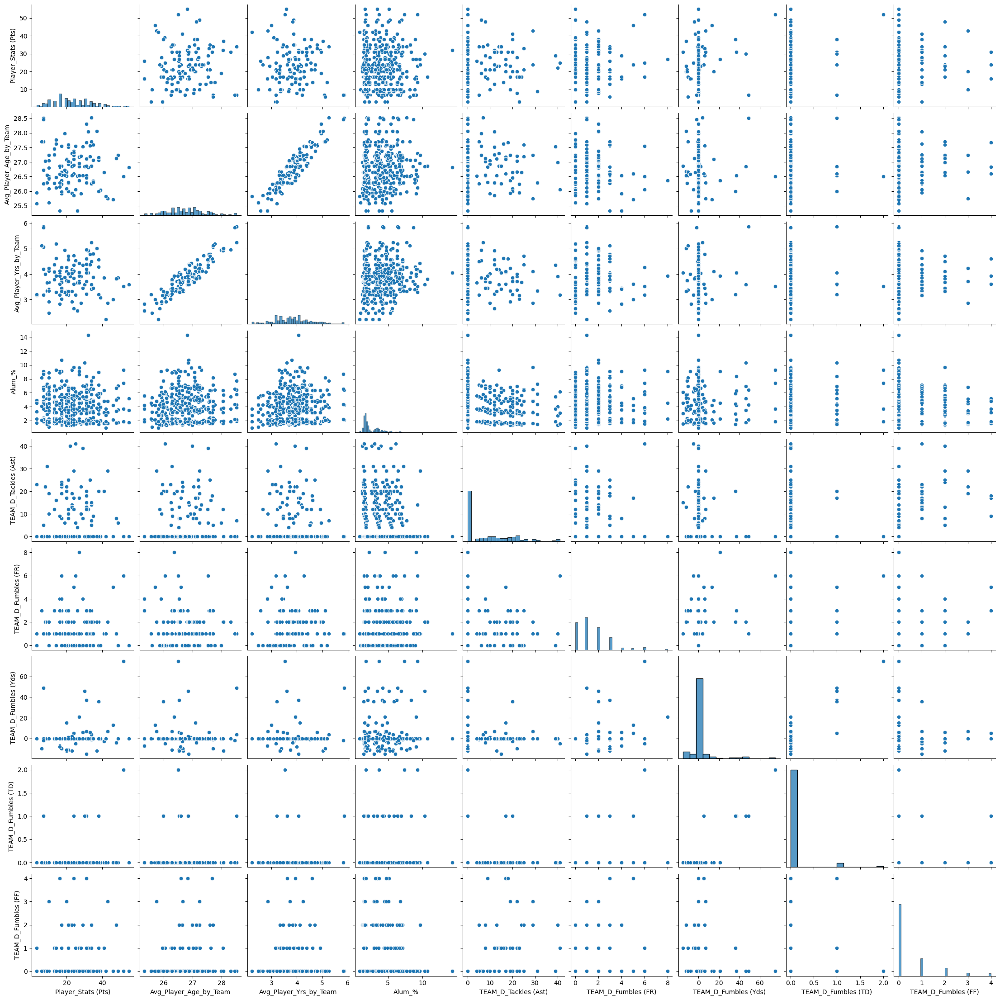

In [98]:
# Create a pair plot 

g6 = sns.pairplot(sbs_sub_pair_6)

In [99]:
# sub 5

sbs_sub_pair_5 = df_sbs_v6[['Player_Stats (Pts)', 'Avg_Player_Age_by_Team', 'Avg_Player_Yrs_by_Team', 'Alum_%', 'TEAM_D_Interceptions (Yds)', 'TEAM_D_Interceptions (Lng)', 'TEAM_D_Sacks (Sk)', 'TEAM_D_Tackles (Comb)', 'TEAM_D_Tackles (Solo)']]

C:\Users\pjbac\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


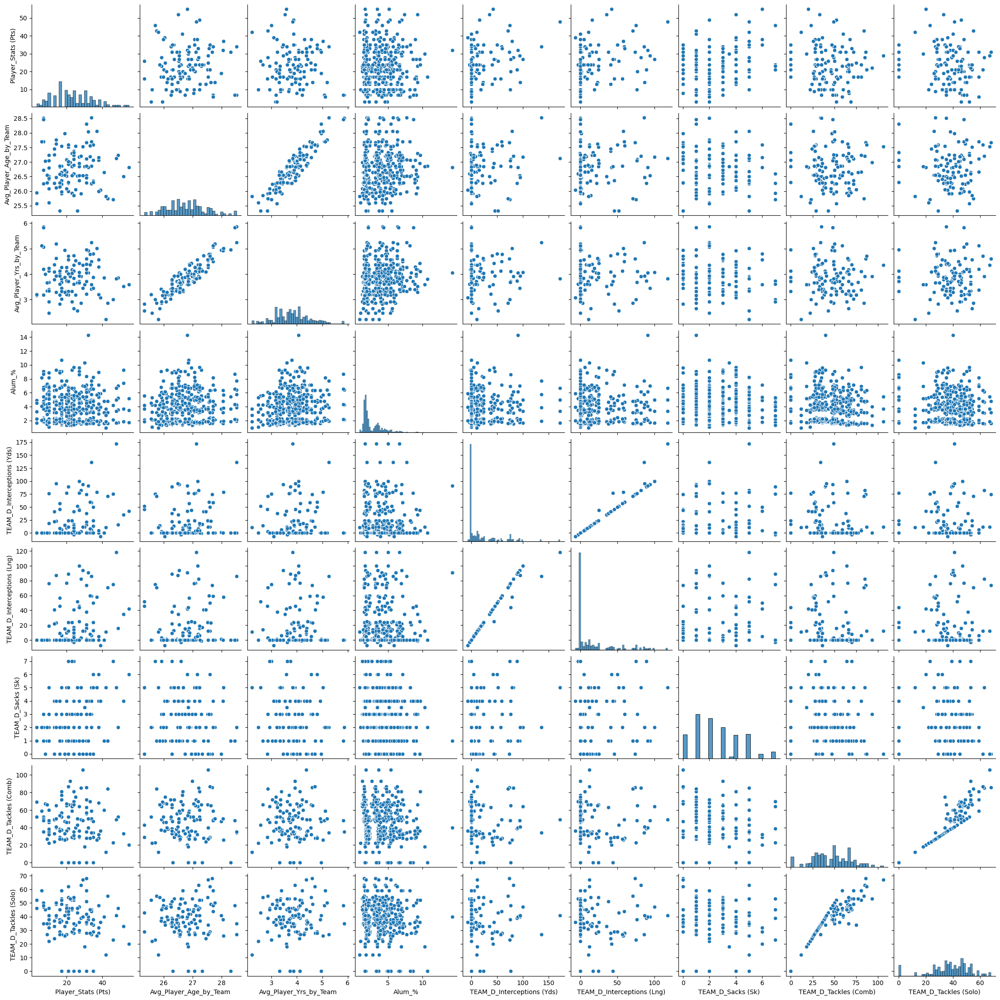

In [100]:
# Create a pair plot 

g5 = sns.pairplot(sbs_sub_pair_5)

In [101]:
# sub 4 

sbs_sub_pair_4 = df_sbs_v6[['Player_Stats (Pts)', 'Avg_Player_Age_by_Team', 'Avg_Player_Yrs_by_Team', 'Alum_%', 'TEAM_O_Receiving (TD)', 'TEAM_O_Receiving (Lng)', 'TEAM_O_Fumbles (Fmb)', 'TEAM_O_Fumbles (FL)', 'TEAM_D_Interceptions (Int)']]

C:\Users\pjbac\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


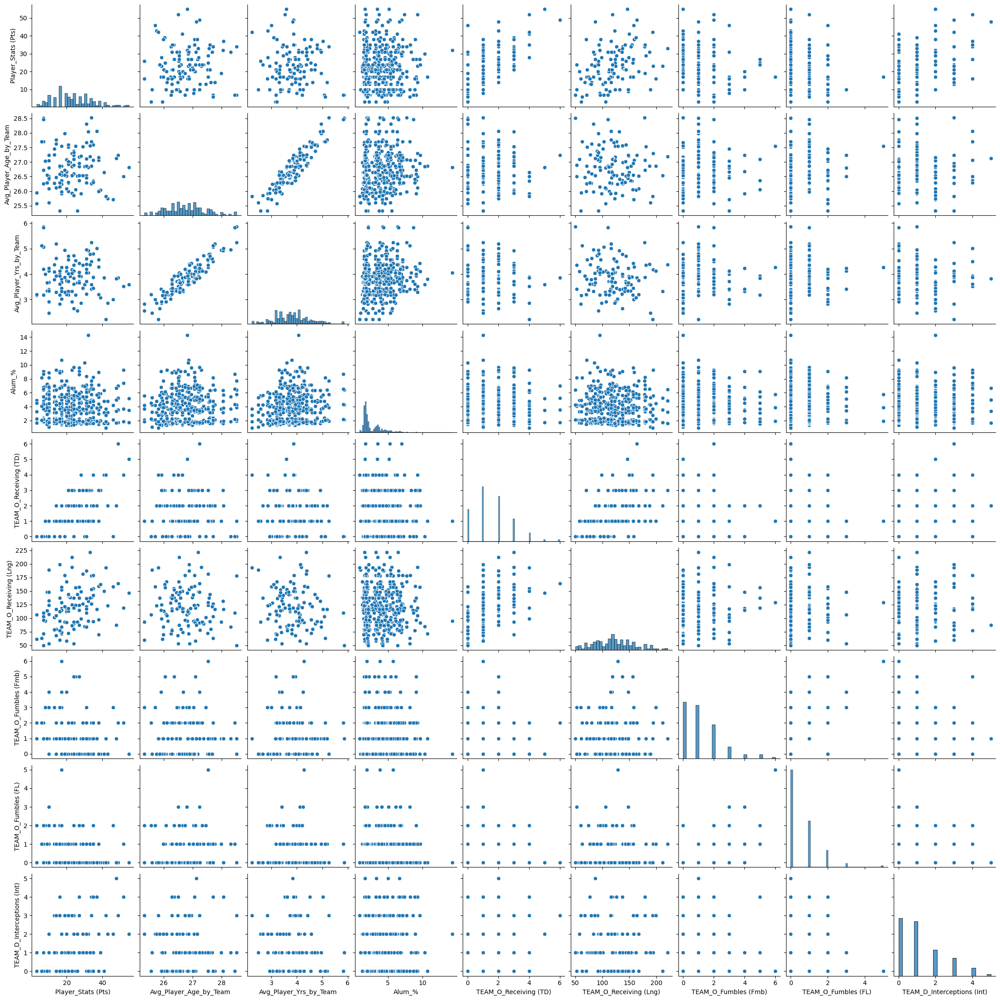

In [102]:
# Create a pair plot 

g4 = sns.pairplot(sbs_sub_pair_4)

In [103]:
# sub 3 

sbs_sub_pair_3 = df_sbs_v6[['Player_Stats (Pts)', 'Avg_Player_Age_by_Team', 'Avg_Player_Yrs_by_Team', 'Alum_%', 'TEAM_O_Rushing (Yds)', 'TEAM_O_Rushing (TD)', 'TEAM_O_Rushing (Lng)', 'TEAM_O_Receiving (Rec)', 'TEAM_O_Receiving (Yds)']]

C:\Users\pjbac\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


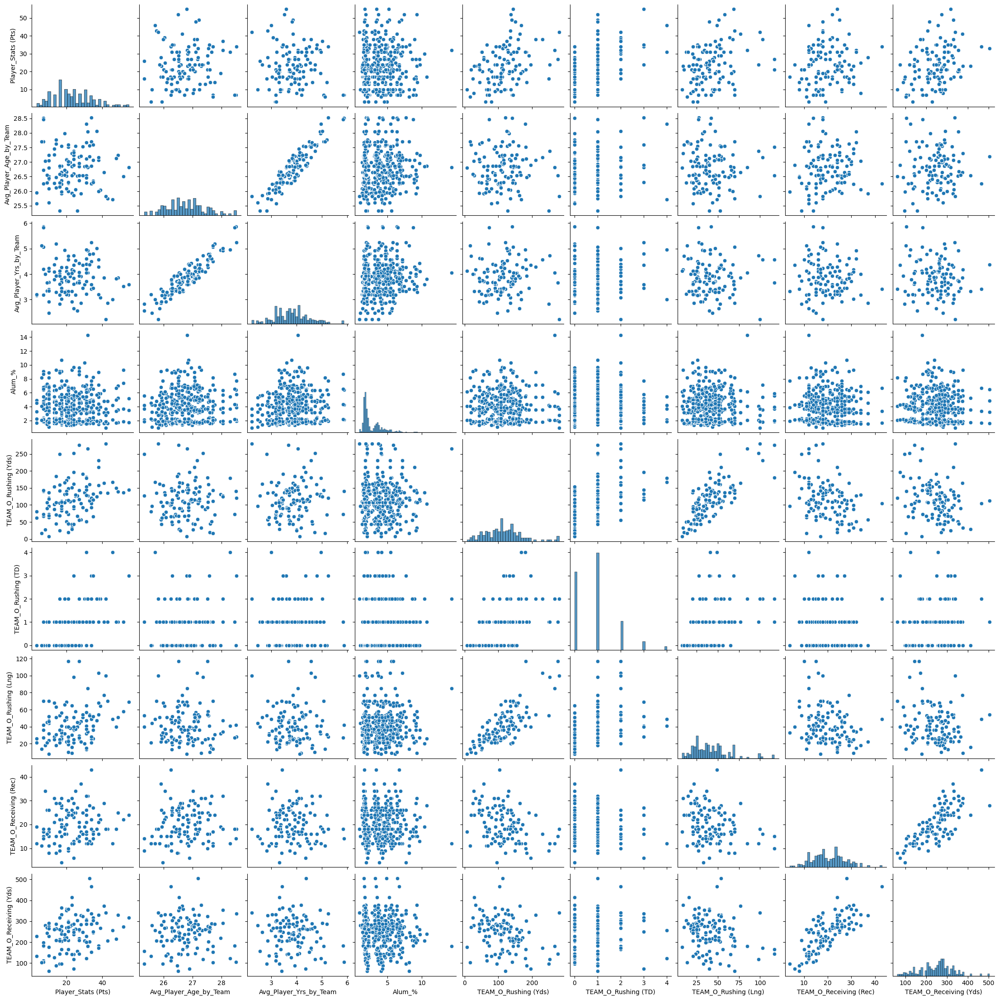

In [104]:
# Create a pair plot 

g3 = sns.pairplot(sbs_sub_pair_3)

In [105]:
# sub 2 

sbs_sub_pair_2 = df_sbs_v6[['Player_Stats (Pts)', 'Avg_Player_Age_by_Team', 'Avg_Player_Yrs_by_Team', 'Alum_%', 'TEAM_O_Passing (Sk)', 'TEAM_O_Passing (Yds.1)', 'TEAM_O_Passing (Lng)', 'TEAM_O_Passing (Rate)', 'TEAM_O_Rushing (Att)']]

C:\Users\pjbac\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


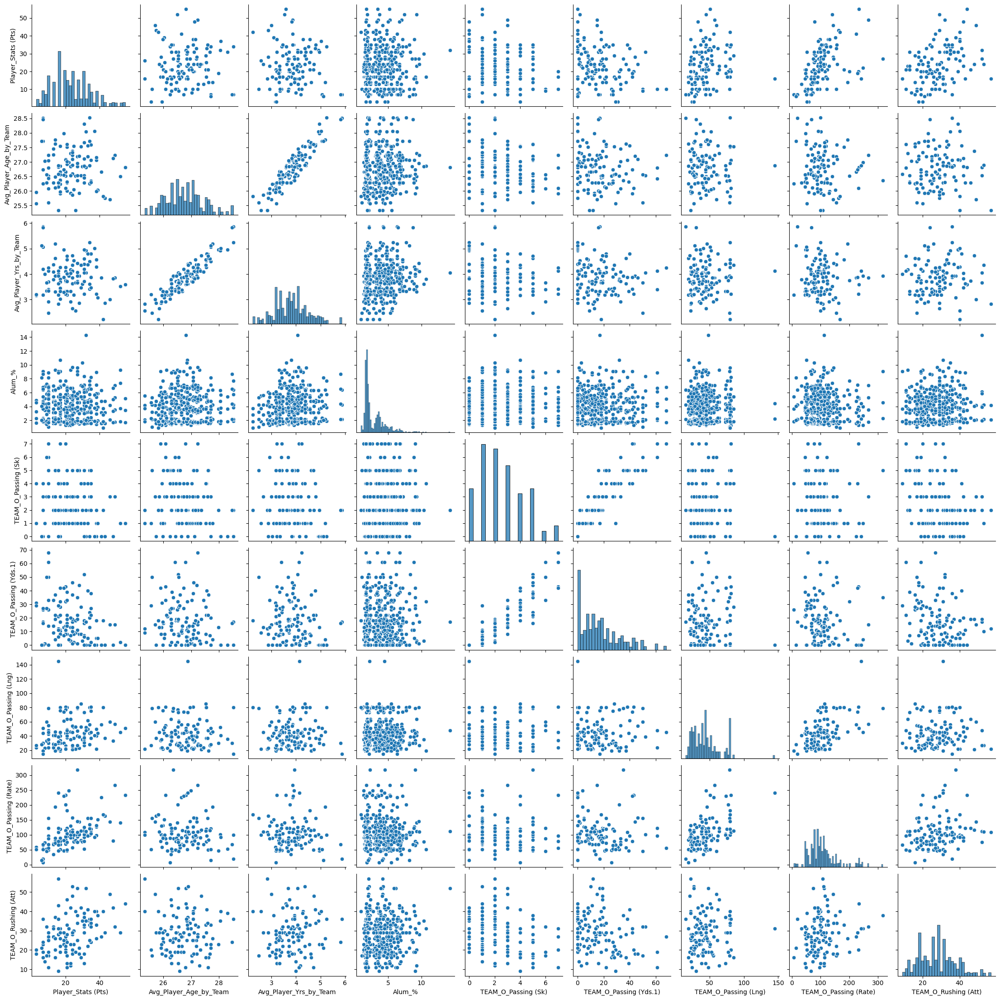

In [106]:
# Create a pair plot 

g2 = sns.pairplot(sbs_sub_pair_2)

In [107]:
# sub 1 

sbs_sub_pair_1 = df_sbs_v6[['Player_Stats (Pts)', 'Avg_Player_Age_by_Team', 'Avg_Player_Yrs_by_Team', 'Alum_%', 'TEAM_O_Rushing (Att)', 'TEAM_O_Passing (Cmp)', 'TEAM_O_Passing (Yds)', 'TEAM_O_Passing (Int)', 'TEAM_O_Passing (TD)']]

C:\Users\pjbac\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


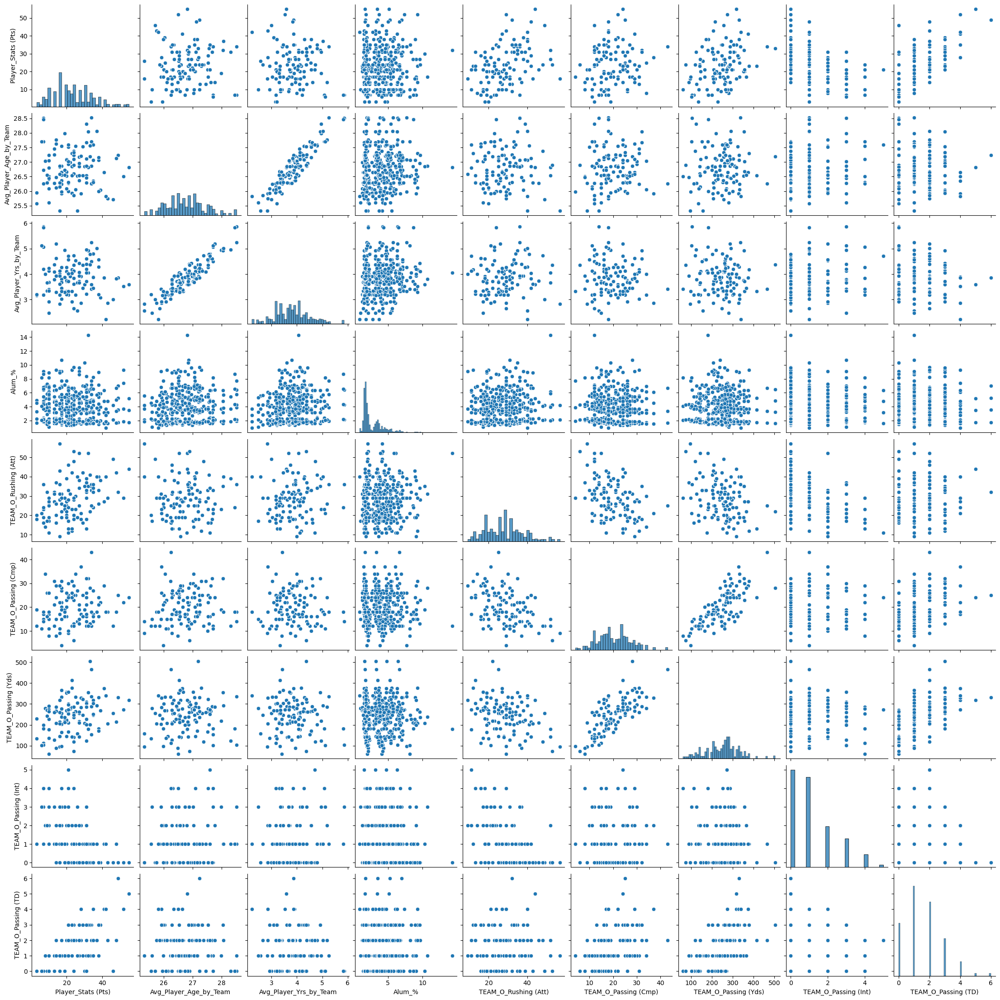

In [108]:
# Create a pair plot 

g = sns.pairplot(sbs_sub_pair_1)

### As expected, all of the stats show similar correlations, either they're obvious cause and effect situations or they're too scattered to to be connected. 
>### I'd like to continue to explore the relationship between Total Points and both Passing Interceptions & Rushing Attempts. These two factors seem to have the most effect on the outcome of a game. Though the correlations may not be that strong I think it will be interesting to see which alumni populate the more successful teams in these 2 categories and if there are any patterns.

<a id='6'></a> <br>
## 6. Categorical Plot

In [109]:
# first create a sub df of teams and total pts

df_team_rush_att = df_sbs_v6[['Player_Stats (Key)', 'TEAM_O_Rushing (Att)']]

In [110]:
# check df

df_team_rush_att

,Player_Stats (Key),TEAM_O_Rushing (Att)
0,ARI43,12
1,ARI43,12
2,ARI43,12
3,ARI43,12
4,ARI43,12
...,...,...
6533,MIN9,21
6534,MIN9,21
6535,MIN9,21
6536,MIN9,21


In [111]:
df_team_rush_att = df_team_rush_att.drop_duplicates('Player_Stats (Key)')

In [112]:
# check value_counts

df_team_rush_att['TEAM_O_Rushing (Att)'].value_counts()

TEAM_O_Rushing (Att)
29    9
19    7
25    6
31    5
32    5
33    4
40    4
36    4
23    4
20    4
26    4
27    4
28    4
18    4
17    4
16    3
35    3
24    3
42    3
13    3
22    3
34    2
38    2
21    2
11    2
52    2
37    2
39    2
30    1
41    1
9     1
53    1
12    1
14    1
48    1
49    1
44    1
57    1
46    1
43    1
Name: count, dtype: int64

<Axes: xlabel='TEAM_O_Rushing (Att)', ylabel='Count'>

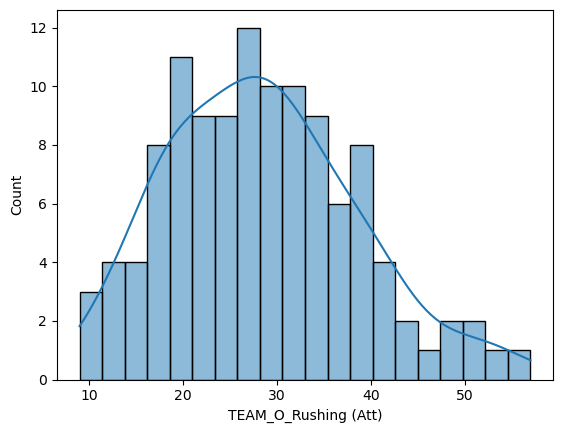

In [113]:
# create a histogram of rush attempts
# The argument "kde" add a line that encompasses the distribution

sns.histplot(df_team_rush_att['TEAM_O_Rushing (Att)'], bins = 20, kde = True)

### Based on the histogram I will create 3 categories for TEAM_O_Rushing (Att):
>##### 1. 'Low Rush Att' = 0-20
>##### 2. 'Avg Rush Att' = 21-40
>##### 3. 'High Rush Att' = 41+

In [114]:
df_sbs_v6.loc[df_sbs_v6['TEAM_O_Rushing (Att)'] <= 20, 'Rush_Att_Category'] = 'Low Rush Att'

In [115]:
df_sbs_v6.loc[(df_sbs_v6['TEAM_O_Rushing (Att)'] > 20) & (df_sbs_v6['TEAM_O_Rushing (Att)'] <= 40), 'Rush_Att_Category'] = 'Avg Rush Att'

In [116]:
df_sbs_v6.loc[df_sbs_v6['TEAM_O_Rushing (Att)'] > 40, 'Rush_Att_Category'] = 'High Rush Att'

In [117]:
# check new cols

df_sbs_v6.head()

,Player_Stats (Tm),Player_Stats (SB),Player_Stats (Key),Player_Stats (Player),Player_Stats (No.),Player_Stats (Age)_x,Player_Stats (Pos),Player_Stats (College/Univ),Player_Stats (Univ_State),Player_Stats (BirthDate),Player_Stats (Yrs)_x,Player_Stats (Super_bowl),Player_Stats (Team),Player_Stats (Pts),Player_Stats (MVP),Player_Stats (Stadium),Player_Stats (City),Player_Stats (State),Player_Stats (Date),Player_Stats (W/L),O_Passing (Cmp),O_Passing (Att),O_Passing (Yds),O_Passing (TD),O_Passing (Int),O_Passing (Sk),O_Passing (Yds.1),O_Passing (Lng),O_Passing (Rate),O_Rushing (Att),O_Rushing (Yds),O_Rushing (TD),O_Rushing (Lng),O_Receiving (Rec),O_Receiving (Yds),O_Receiving (TD),O_Receiving (Lng),O_Fumbles (Fmb),O_Fumbles (FL),D_Interceptions (Int),D_Interceptions (Yds),D_Interceptions (TD),D_Interceptions (Lng),D_Sacks (Sk),D_Tackles (Comb),D_Tackles (Solo),D_Tackles (Ast),D_Fumbles (FR),D_Fumbles (Yds),D_Fumbles (TD),D_Fumbles (FF),SPT_Kick_Returns (Rt),SPT_Kick_Returns (Yds),SPT_Kick_Returns (Y/Rt),SPT_Kick_Returns (TD),SPT_Kick_Returns (Lng),SPT_Punt_Returns (Ret),SPT_Punt_Returns (Yds),SPT_Punt_Returns (Y/R),SPT_Punt_Returns (TD),SPT_Punt_Returns (Lng),SPT_Scoring (XPM),SPT_Scoring (XPA),SPT_Scoring (FGM),SPT_Scoring (FGA),SPT_Punting (Pnt),SPT_Punting (Yds),SPT_Punting (Y/P),SPT_Punting (Lng),Unique_Key,Univ_Alum_per_Team,Univ_Alum_per_SB,Univ_Total_Rings,Univ_Total_Wins,Univ_Total_MVPs,State_Alum_per_Team,State_Alum_per_SB,State_Total_Rings,State_Total_Wins,State_Total_MVPs,Total_Wins_by_Team,Total_#_of_players,Alum_%,Avg_Player_Age_by_Team,Avg_Player_Yrs_by_Team,TEAM_O_Passing (Cmp),TEAM_O_Passing (Att),TEAM_O_Passing (Yds),TEAM_O_Passing (TD),TEAM_O_Passing (Int),TEAM_O_Passing (Sk),TEAM_O_Passing (Yds.1),TEAM_O_Passing (Lng),TEAM_O_Passing (Rate),TEAM_O_Rushing (Att),TEAM_O_Rushing (Yds),TEAM_O_Rushing (TD),TEAM_O_Rushing (Lng),TEAM_O_Receiving (Rec),TEAM_O_Receiving (Yds),TEAM_O_Receiving (TD),TEAM_O_Receiving (Lng),TEAM_O_Fumbles (Fmb),TEAM_O_Fumbles (FL),TEAM_D_Interceptions (Int),TEAM_D_Interceptions (Yds),TEAM_D_Interceptions (TD),TEAM_D_Interceptions (Lng),TEAM_D_Sacks (Sk),TEAM_D_Tackles (Comb),TEAM_D_Tackles (Solo),TEAM_D_Tackles (Ast),TEAM_D_Fumbles (FR),TEAM_D_Fumbles (Yds),TEAM_D_Fumbles (TD),TEAM_D_Fumbles (FF),TEAM_SPT_Kick_Returns (Rt),TEAM_SPT_Kick_Returns (Yds),TEAM_SPT_Kick_Returns (Y/Rt),TEAM_SPT_Kick_Returns (TD),TEAM_SPT_Kick_Returns (Lng),TEAM_SPT_Punt_Returns (Ret),TEAM_SPT_Punt_Returns (Yds),TEAM_SPT_Punt_Returns (Y/R),TEAM_SPT_Punt_Returns (TD),TEAM_SPT_Punt_Returns (Lng),TEAM_SPT_Scoring (XPM),TEAM_SPT_Scoring (XPA),TEAM_SPT_Scoring (FGM),TEAM_SPT_Scoring (FGA),TEAM_SPT_Punting (Pnt),TEAM_SPT_Punting (Yds),TEAM_SPT_Punting (Y/P),TEAM_SPT_Punting (Lng),Rush_Att_Category
0,ARI,43,ARI43,Aaron Francisco,47,25,DB,BYU,UT,7/5/1983,3,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,ARI43Aaron Francisco,1.0,3.0,40.0,31.0,3.0,1.0,4.0,77.0,43.0,3.0,0.0,54,1.85,27.3,4.17,31,43,377,3,1,2,3,64,112.3,12,33,0,9,31,377,3,194,2,1,1,-1,0,-1,3.0,66,52,14,1,0,0,0,5,91,29.5,0,32,2,34,17.0,0,34,3,3,0,0,5,180,36.0,45,Low Rush Att
1,ARI,43,ARI43,Adrian Wilson,24,29,SS,North Carolina St.,NC,10/12/1979,7,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,7,7,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,ARI43Adrian Wilson,1.0,1.0,22.0,19.0,0.0,1.0,5.0,123.0,50.0,0.0,0.0,54,1.85,27.3,4.17,31,43,377,3,1,2,3,64,112.3,12,33,0,9,31,377,3,194,2,1,1,-1,0,-1,3.0,66,52,14,1,0,0,0,5,91,29.5,0,32,2,34,17.0,0,34,3,3,0,0,5,180,36.0,45,Low Rush Att
2,ARI,43,ARI43,Alan Branch,78,24,DT,Michigan,MI,12/29/1984,1,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0

In [118]:
df_rush_att = df_sbs_v6[['Player_Stats (Key)', 'Player_Stats (W/L)', 'Player_Stats (Pts)', 'Rush_Att_Category']]

In [119]:
df_rush_att = df_rush_att.drop_duplicates('Player_Stats (Key)')

In [120]:
df_rush_att['Rush_Att_Category'].value_counts(dropna = False)

Rush_Att_Category
Avg Rush Att     73
Low Rush Att     30
High Rush Att    13
Name: count, dtype: int64

C:\Users\pjbac\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


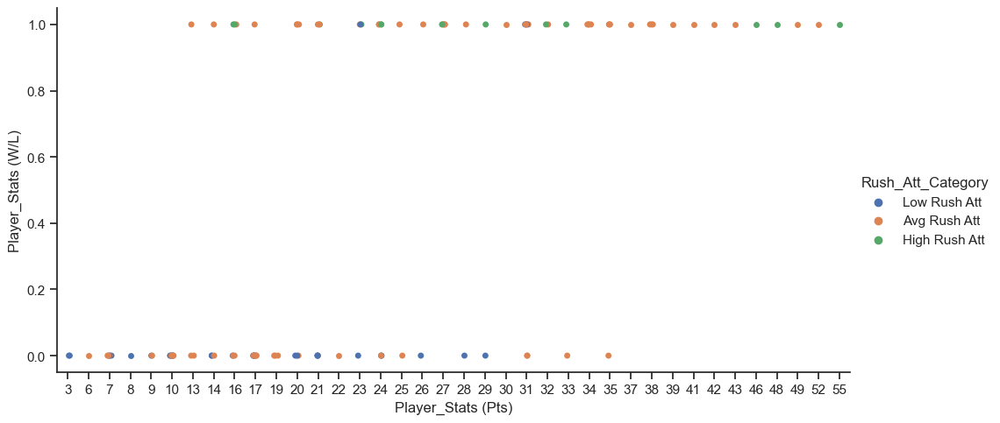

In [121]:
# Create a categorical plot of Rush_Att_Category

sns.set(style='ticks')
gpts = sns.catplot(x='Player_Stats (Pts)', y='Player_Stats (W/L)', hue='Rush_Att_Category', data=df_rush_att, height = 5, aspect = 2)

### In the catplot above, I am comparing if a team won or lost and their total points scored, and categorizing each by the number of rush attempts they performed. My thought behind this plot, informed from the previous heatmaps and pair plots, was that the greater the number of rush attempts a team had, the higher their scores would be and therefore give them a better chance of winning the game. 

### The catplot clearly shows that higher rush attempts is indicative of the winning team, and in fact non-existent in the losing teams.

<a id='7'></a> <br>
## 7. Key Questions Answered

    * Which college has the most Super Bowl alumni?
    * Which state, via the colleges, produced the most Super Bowl alumni? 
    * Which college has the most Super Bowl wins? 
    * Which college has the most Super Bowl mvps? 
    * Who is/are the most prominent player(s) from the top 10 colleges? 
    * Which college has the best stats? 
        o Passing yards 
        o Receiving yards  
        o # of receptions 
        o Tds 
        o Points 
    * Does having more players from the same college on a team give you a better chance of winning the Super Bowl? 
    * Does having players from higher ranked college teams help to win Super Bowls? 

In [122]:
df_sbs_v6.head()

,Player_Stats (Tm),Player_Stats (SB),Player_Stats (Key),Player_Stats (Player),Player_Stats (No.),Player_Stats (Age)_x,Player_Stats (Pos),Player_Stats (College/Univ),Player_Stats (Univ_State),Player_Stats (BirthDate),Player_Stats (Yrs)_x,Player_Stats (Super_bowl),Player_Stats (Team),Player_Stats (Pts),Player_Stats (MVP),Player_Stats (Stadium),Player_Stats (City),Player_Stats (State),Player_Stats (Date),Player_Stats (W/L),O_Passing (Cmp),O_Passing (Att),O_Passing (Yds),O_Passing (TD),O_Passing (Int),O_Passing (Sk),O_Passing (Yds.1),O_Passing (Lng),O_Passing (Rate),O_Rushing (Att),O_Rushing (Yds),O_Rushing (TD),O_Rushing (Lng),O_Receiving (Rec),O_Receiving (Yds),O_Receiving (TD),O_Receiving (Lng),O_Fumbles (Fmb),O_Fumbles (FL),D_Interceptions (Int),D_Interceptions (Yds),D_Interceptions (TD),D_Interceptions (Lng),D_Sacks (Sk),D_Tackles (Comb),D_Tackles (Solo),D_Tackles (Ast),D_Fumbles (FR),D_Fumbles (Yds),D_Fumbles (TD),D_Fumbles (FF),SPT_Kick_Returns (Rt),SPT_Kick_Returns (Yds),SPT_Kick_Returns (Y/Rt),SPT_Kick_Returns (TD),SPT_Kick_Returns (Lng),SPT_Punt_Returns (Ret),SPT_Punt_Returns (Yds),SPT_Punt_Returns (Y/R),SPT_Punt_Returns (TD),SPT_Punt_Returns (Lng),SPT_Scoring (XPM),SPT_Scoring (XPA),SPT_Scoring (FGM),SPT_Scoring (FGA),SPT_Punting (Pnt),SPT_Punting (Yds),SPT_Punting (Y/P),SPT_Punting (Lng),Unique_Key,Univ_Alum_per_Team,Univ_Alum_per_SB,Univ_Total_Rings,Univ_Total_Wins,Univ_Total_MVPs,State_Alum_per_Team,State_Alum_per_SB,State_Total_Rings,State_Total_Wins,State_Total_MVPs,Total_Wins_by_Team,Total_#_of_players,Alum_%,Avg_Player_Age_by_Team,Avg_Player_Yrs_by_Team,TEAM_O_Passing (Cmp),TEAM_O_Passing (Att),TEAM_O_Passing (Yds),TEAM_O_Passing (TD),TEAM_O_Passing (Int),TEAM_O_Passing (Sk),TEAM_O_Passing (Yds.1),TEAM_O_Passing (Lng),TEAM_O_Passing (Rate),TEAM_O_Rushing (Att),TEAM_O_Rushing (Yds),TEAM_O_Rushing (TD),TEAM_O_Rushing (Lng),TEAM_O_Receiving (Rec),TEAM_O_Receiving (Yds),TEAM_O_Receiving (TD),TEAM_O_Receiving (Lng),TEAM_O_Fumbles (Fmb),TEAM_O_Fumbles (FL),TEAM_D_Interceptions (Int),TEAM_D_Interceptions (Yds),TEAM_D_Interceptions (TD),TEAM_D_Interceptions (Lng),TEAM_D_Sacks (Sk),TEAM_D_Tackles (Comb),TEAM_D_Tackles (Solo),TEAM_D_Tackles (Ast),TEAM_D_Fumbles (FR),TEAM_D_Fumbles (Yds),TEAM_D_Fumbles (TD),TEAM_D_Fumbles (FF),TEAM_SPT_Kick_Returns (Rt),TEAM_SPT_Kick_Returns (Yds),TEAM_SPT_Kick_Returns (Y/Rt),TEAM_SPT_Kick_Returns (TD),TEAM_SPT_Kick_Returns (Lng),TEAM_SPT_Punt_Returns (Ret),TEAM_SPT_Punt_Returns (Yds),TEAM_SPT_Punt_Returns (Y/R),TEAM_SPT_Punt_Returns (TD),TEAM_SPT_Punt_Returns (Lng),TEAM_SPT_Scoring (XPM),TEAM_SPT_Scoring (XPA),TEAM_SPT_Scoring (FGM),TEAM_SPT_Scoring (FGA),TEAM_SPT_Punting (Pnt),TEAM_SPT_Punting (Yds),TEAM_SPT_Punting (Y/P),TEAM_SPT_Punting (Lng),Rush_Att_Category
0,ARI,43,ARI43,Aaron Francisco,47,25,DB,BYU,UT,7/5/1983,3,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,ARI43Aaron Francisco,1.0,3.0,40.0,31.0,3.0,1.0,4.0,77.0,43.0,3.0,0.0,54,1.85,27.3,4.17,31,43,377,3,1,2,3,64,112.3,12,33,0,9,31,377,3,194,2,1,1,-1,0,-1,3.0,66,52,14,1,0,0,0,5,91,29.5,0,32,2,34,17.0,0,34,3,3,0,0,5,180,36.0,45,Low Rush Att
1,ARI,43,ARI43,Adrian Wilson,24,29,SS,North Carolina St.,NC,10/12/1979,7,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,7,7,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,ARI43Adrian Wilson,1.0,1.0,22.0,19.0,0.0,1.0,5.0,123.0,50.0,0.0,0.0,54,1.85,27.3,4.17,31,43,377,3,1,2,3,64,112.3,12,33,0,9,31,377,3,194,2,1,1,-1,0,-1,3.0,66,52,14,1,0,0,0,5,91,29.5,0,32,2,34,17.0,0,34,3,3,0,0,5,180,36.0,45,Low Rush Att
2,ARI,43,ARI43,Alan Branch,78,24,DT,Michigan,MI,12/29/1984,1,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0

>### Which college has the most Super Bowl alumni?
    1. USC	        90
    2. Miami (FL)	89
    3. Penn St.     80
    4. Tennessee    80
    5. Michigan     79

In [123]:
# Find the highest number of sb alum by college

ct_univ_total_alum = pd.crosstab(df_sbs_v6['Player_Stats (College/Univ)'], df_sbs_v6['Player_Stats (Player)'])

In [124]:
# check ct

ct_univ_total_alum.head()

Player_Stats (Player),A'Shawn Robinson,A.J. Brown,A.J. Derby,A.J. Duhe,A.J. Edds,A.J. Hawk,A.J. Jenkins,A.J. Johnson,A.J. Klein,A.Q. Shipley,Aaron Banks,Aaron Brewer,Aaron Brown,Aaron Dobson,Aaron Donald,Aaron Francisco,Aaron Hayden,Aaron Hernandez,Aaron Kyle,Aaron Laing,Aaron Moorehead,Aaron Rodgers,Aaron Ross,Aaron Smith,Aaron Stecker,Aaron Stinnie,Aaron Taylor,Adalius Thomas,Adam Archuleta,Adam Butler,Adam Koets,Adam Lingner,Adam Schreiber,Adam Timmerman,Adam Treu,Adam Vinatieri,Adam Walker,Adewale Ogunleye,Adrian Awasom,Adrian Clayborn,Adrian Hamilton,Adrian Hardy,Adrian Klemm,Adrian Peterson,Adrian Robinson,Adrian Wilson,Aeneas Williams,Ahkello Witherspoon,Ahmad Bradshaw,Ahmad Brooks,Ahmad Rashad,Airese Currie,Akeem Ayers,Akeem Davis-Gaither,Al Atkinson,Al Chesley,Al Del Greco,Al Dixon,Al Edwards,Al Jenkins,Al Randolph,Al Reynolds,Al Wallace,Alain Kashama,Alan Branch,Alan Faneca,Alan Page,...,William Floyd,William Gay,William Gholston,William Hampton,William Henderson,William Judson,William Perry,William Roberts,William White,Willie Andrews,Willie Brown,Willie Clark,Willie Clay,Willie Colon,Willie Davis,Willie Gary,Willie Gault,Willie Gay Jr.,Willie Green,Willie Hall,Willie Harper,Willie Jones,Willie Lanier,Willie McGinest,Willie Miller,Willie Mitchell,Willie Parker,Willie Richardson,Willie Snead,Willie Williams,Willie Wood,Willie Young,Wilson Whitley,Windlan Hall,Winford Hood,Winston Hill,Winston Justice,Woodrow Hamilton,Woody Bennett,Woody Peoples,Wyatt Ray,Wymon Henderson,Xavier Su'a-Filo,Xavier Williams,Yancey Thigpen,Yasir Durant,Yo Murphy,Zac Henderson,Zach Ertz,Zach Kerr,Zach Miller,Zach Moore,Zach Pascal,Zach Piller,Zach Strief,Zach Triner,Zachary Dixon,Zack Crockett,Zack Valentine,Zak DeOssie,Zane Beadles,Zayne Anderson,Zech McPhearson,Zeke Bratkowski,Zeke Mowatt,Zeph Lee,Zoltan Mesko
Player_Stats (College/Univ),,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Abilene Christian,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Air Force,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Akron,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Ala-Birmingham,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Alabama,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [125]:
# Change all numbers greater than 1 to 1 using numpy.where() - only need one instance

ct_univ_total_alum[ct_univ_total_alum > 1] = 1

In [126]:
# check result

ct_univ_total_alum.head()

Player_Stats (Player),A'Shawn Robinson,A.J. Brown,A.J. Derby,A.J. Duhe,A.J. Edds,A.J. Hawk,A.J. Jenkins,A.J. Johnson,A.J. Klein,A.Q. Shipley,Aaron Banks,Aaron Brewer,Aaron Brown,Aaron Dobson,Aaron Donald,Aaron Francisco,Aaron Hayden,Aaron Hernandez,Aaron Kyle,Aaron Laing,Aaron Moorehead,Aaron Rodgers,Aaron Ross,Aaron Smith,Aaron Stecker,Aaron Stinnie,Aaron Taylor,Adalius Thomas,Adam Archuleta,Adam Butler,Adam Koets,Adam Lingner,Adam Schreiber,Adam Timmerman,Adam Treu,Adam Vinatieri,Adam Walker,Adewale Ogunleye,Adrian Awasom,Adrian Clayborn,Adrian Hamilton,Adrian Hardy,Adrian Klemm,Adrian Peterson,Adrian Robinson,Adrian Wilson,Aeneas Williams,Ahkello Witherspoon,Ahmad Bradshaw,Ahmad Brooks,Ahmad Rashad,Airese Currie,Akeem Ayers,Akeem Davis-Gaither,Al Atkinson,Al Chesley,Al Del Greco,Al Dixon,Al Edwards,Al Jenkins,Al Randolph,Al Reynolds,Al Wallace,Alain Kashama,Alan Branch,Alan Faneca,Alan Page,...,William Floyd,William Gay,William Gholston,William Hampton,William Henderson,William Judson,William Perry,William Roberts,William White,Willie Andrews,Willie Brown,Willie Clark,Willie Clay,Willie Colon,Willie Davis,Willie Gary,Willie Gault,Willie Gay Jr.,Willie Green,Willie Hall,Willie Harper,Willie Jones,Willie Lanier,Willie McGinest,Willie Miller,Willie Mitchell,Willie Parker,Willie Richardson,Willie Snead,Willie Williams,Willie Wood,Willie Young,Wilson Whitley,Windlan Hall,Winford Hood,Winston Hill,Winston Justice,Woodrow Hamilton,Woody Bennett,Woody Peoples,Wyatt Ray,Wymon Henderson,Xavier Su'a-Filo,Xavier Williams,Yancey Thigpen,Yasir Durant,Yo Murphy,Zac Henderson,Zach Ertz,Zach Kerr,Zach Miller,Zach Moore,Zach Pascal,Zach Piller,Zach Strief,Zach Triner,Zachary Dixon,Zack Crockett,Zack Valentine,Zak DeOssie,Zane Beadles,Zayne Anderson,Zech McPhearson,Zeke Bratkowski,Zeke Mowatt,Zeph Lee,Zoltan Mesko
Player_Stats (College/Univ),,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Abilene Christian,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Air Force,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Akron,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Ala-Birmingham,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Alabama,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [127]:
# create total column

ct_univ_total_alum['Total_Alum_by_Univ'] = ct_univ_total_alum.sum(axis=1)

In [128]:
# check col

ct_univ_total_alum.head()

Player_Stats (Player),A'Shawn Robinson,A.J. Brown,A.J. Derby,A.J. Duhe,A.J. Edds,A.J. Hawk,A.J. Jenkins,A.J. Johnson,A.J. Klein,A.Q. Shipley,Aaron Banks,Aaron Brewer,Aaron Brown,Aaron Dobson,Aaron Donald,Aaron Francisco,Aaron Hayden,Aaron Hernandez,Aaron Kyle,Aaron Laing,Aaron Moorehead,Aaron Rodgers,Aaron Ross,Aaron Smith,Aaron Stecker,Aaron Stinnie,Aaron Taylor,Adalius Thomas,Adam Archuleta,Adam Butler,Adam Koets,Adam Lingner,Adam Schreiber,Adam Timmerman,Adam Treu,Adam Vinatieri,Adam Walker,Adewale Ogunleye,Adrian Awasom,Adrian Clayborn,Adrian Hamilton,Adrian Hardy,Adrian Klemm,Adrian Peterson,Adrian Robinson,Adrian Wilson,Aeneas Williams,Ahkello Witherspoon,Ahmad Bradshaw,Ahmad Brooks,Ahmad Rashad,Airese Currie,Akeem Ayers,Akeem Davis-Gaither,Al Atkinson,Al Chesley,Al Del Greco,Al Dixon,Al Edwards,Al Jenkins,Al Randolph,Al Reynolds,Al Wallace,Alain Kashama,Alan Branch,Alan Faneca,Alan Page,...,William Gay,William Gholston,William Hampton,William Henderson,William Judson,William Perry,William Roberts,William White,Willie Andrews,Willie Brown,Willie Clark,Willie Clay,Willie Colon,Willie Davis,Willie Gary,Willie Gault,Willie Gay Jr.,Willie Green,Willie Hall,Willie Harper,Willie Jones,Willie Lanier,Willie McGinest,Willie Miller,Willie Mitchell,Willie Parker,Willie Richardson,Willie Snead,Willie Williams,Willie Wood,Willie Young,Wilson Whitley,Windlan Hall,Winford Hood,Winston Hill,Winston Justice,Woodrow Hamilton,Woody Bennett,Woody Peoples,Wyatt Ray,Wymon Henderson,Xavier Su'a-Filo,Xavier Williams,Yancey Thigpen,Yasir Durant,Yo Murphy,Zac Henderson,Zach Ertz,Zach Kerr,Zach Miller,Zach Moore,Zach Pascal,Zach Piller,Zach Strief,Zach Triner,Zachary Dixon,Zack Crockett,Zack Valentine,Zak DeOssie,Zane Beadles,Zayne Anderson,Zech McPhearson,Zeke Bratkowski,Zeke Mowatt,Zeph Lee,Zoltan Mesko,Total_Alum_by_Univ
Player_Stats (College/Univ),,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Abilene Christian,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6
Air Force,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5
Akron,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4
Ala-Birmingham,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4
Alabama,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,66


In [129]:
# reset index

ct_univ_total_alum = ct_univ_total_alum.reset_index()

In [130]:
# check result

ct_univ_total_alum.head()

Player_Stats (Player),Player_Stats (College/Univ),A'Shawn Robinson,A.J. Brown,A.J. Derby,A.J. Duhe,A.J. Edds,A.J. Hawk,A.J. Jenkins,A.J. Johnson,A.J. Klein,A.Q. Shipley,Aaron Banks,Aaron Brewer,Aaron Brown,Aaron Dobson,Aaron Donald,Aaron Francisco,Aaron Hayden,Aaron Hernandez,Aaron Kyle,Aaron Laing,Aaron Moorehead,Aaron Rodgers,Aaron Ross,Aaron Smith,Aaron Stecker,Aaron Stinnie,Aaron Taylor,Adalius Thomas,Adam Archuleta,Adam Butler,Adam Koets,Adam Lingner,Adam Schreiber,Adam Timmerman,Adam Treu,Adam Vinatieri,Adam Walker,Adewale Ogunleye,Adrian Awasom,Adrian Clayborn,Adrian Hamilton,Adrian Hardy,Adrian Klemm,Adrian Peterson,Adrian Robinson,Adrian Wilson,Aeneas Williams,Ahkello Witherspoon,Ahmad Bradshaw,Ahmad Brooks,Ahmad Rashad,Airese Currie,Akeem Ayers,Akeem Davis-Gaither,Al Atkinson,Al Chesley,Al Del Greco,Al Dixon,Al Edwards,Al Jenkins,Al Randolph,Al Reynolds,Al Wallace,Alain Kashama,Alan Branch,Alan Faneca,...,William Gay,William Gholston,William Hampton,William Henderson,William Judson,William Perry,William Roberts,William White,Willie Andrews,Willie Brown,Willie Clark,Willie Clay,Willie Colon,Willie Davis,Willie Gary,Willie Gault,Willie Gay Jr.,Willie Green,Willie Hall,Willie Harper,Willie Jones,Willie Lanier,Willie McGinest,Willie Miller,Willie Mitchell,Willie Parker,Willie Richardson,Willie Snead,Willie Williams,Willie Wood,Willie Young,Wilson Whitley,Windlan Hall,Winford Hood,Winston Hill,Winston Justice,Woodrow Hamilton,Woody Bennett,Woody Peoples,Wyatt Ray,Wymon Henderson,Xavier Su'a-Filo,Xavier Williams,Yancey Thigpen,Yasir Durant,Yo Murphy,Zac Henderson,Zach Ertz,Zach Kerr,Zach Miller,Zach Moore,Zach Pascal,Zach Piller,Zach Strief,Zach Triner,Zachary Dixon,Zack Crockett,Zack Valentine,Zak DeOssie,Zane Beadles,Zayne Anderson,Zech McPhearson,Zeke Bratkowski,Zeke Mowatt,Zeph Lee,Zoltan Mesko,Total_Alum_by_Univ
0,Abilene Christian,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6
1,Air Force,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5
2,Akron,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4
3,Ala-Birmingham,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4
4,Alabama,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,66


In [131]:
# remove all but total col

ct_univ_total_alum = ct_univ_total_alum[['Player_Stats (College/Univ)', 'Total_Alum_by_Univ']]

In [132]:
# check result

ct_univ_total_alum.head()

Player_Stats (Player),Player_Stats (College/Univ),Total_Alum_by_Univ
0,Abilene Christian,6
1,Air Force,5
2,Akron,4
3,Ala-Birmingham,4
4,Alabama,66


In [133]:
# sort by highest tota value and print head

ct_univ_total_alum.sort_values('Total_Alum_by_Univ', ascending=False).head()

Player_Stats (Player),Player_Stats (College/Univ),Total_Alum_by_Univ
333,USC,90
179,Miami (FL),89
248,Penn St.,80
303,Tennessee,80
181,Michigan,79


>### Which state, via the colleges, produced the most Super Bowl alumni?
    1. CA	383
    2. TX	362
    3. FL	294
    4. LA	195
    5. PA	183

In [134]:
# Find the highest number of sb alum by state

ct_state_total_alum = pd.crosstab(df_sbs_v6['Player_Stats (Univ_State)'], df_sbs_v6['Player_Stats (Player)'])

In [135]:
# check ct

ct_state_total_alum.head()

Player_Stats (Player),A'Shawn Robinson,A.J. Brown,A.J. Derby,A.J. Duhe,A.J. Edds,A.J. Hawk,A.J. Jenkins,A.J. Johnson,A.J. Klein,A.Q. Shipley,Aaron Banks,Aaron Brewer,Aaron Brown,Aaron Dobson,Aaron Donald,Aaron Francisco,Aaron Hayden,Aaron Hernandez,Aaron Kyle,Aaron Laing,Aaron Moorehead,Aaron Rodgers,Aaron Ross,Aaron Smith,Aaron Stecker,Aaron Stinnie,Aaron Taylor,Adalius Thomas,Adam Archuleta,Adam Butler,Adam Koets,Adam Lingner,Adam Schreiber,Adam Timmerman,Adam Treu,Adam Vinatieri,Adam Walker,Adewale Ogunleye,Adrian Awasom,Adrian Clayborn,Adrian Hamilton,Adrian Hardy,Adrian Klemm,Adrian Peterson,Adrian Robinson,Adrian Wilson,Aeneas Williams,Ahkello Witherspoon,Ahmad Bradshaw,Ahmad Brooks,Ahmad Rashad,Airese Currie,Akeem Ayers,Akeem Davis-Gaither,Al Atkinson,Al Chesley,Al Del Greco,Al Dixon,Al Edwards,Al Jenkins,Al Randolph,Al Reynolds,Al Wallace,Alain Kashama,Alan Branch,Alan Faneca,Alan Page,...,William Floyd,William Gay,William Gholston,William Hampton,William Henderson,William Judson,William Perry,William Roberts,William White,Willie Andrews,Willie Brown,Willie Clark,Willie Clay,Willie Colon,Willie Davis,Willie Gary,Willie Gault,Willie Gay Jr.,Willie Green,Willie Hall,Willie Harper,Willie Jones,Willie Lanier,Willie McGinest,Willie Miller,Willie Mitchell,Willie Parker,Willie Richardson,Willie Snead,Willie Williams,Willie Wood,Willie Young,Wilson Whitley,Windlan Hall,Winford Hood,Winston Hill,Winston Justice,Woodrow Hamilton,Woody Bennett,Woody Peoples,Wyatt Ray,Wymon Henderson,Xavier Su'a-Filo,Xavier Williams,Yancey Thigpen,Yasir Durant,Yo Murphy,Zac Henderson,Zach Ertz,Zach Kerr,Zach Miller,Zach Moore,Zach Pascal,Zach Piller,Zach Strief,Zach Triner,Zachary Dixon,Zack Crockett,Zack Valentine,Zak DeOssie,Zane Beadles,Zayne Anderson,Zech McPhearson,Zeke Bratkowski,Zeke Mowatt,Zeph Lee,Zoltan Mesko
Player_Stats (Univ_State),,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AL,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
AR,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
AZ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Alberta,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Australia,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [136]:
# Change all numbers greater than 1 to 1 using numpy.where() - only need one instance

ct_state_total_alum[ct_state_total_alum > 1] = 1

In [137]:
# check result

ct_state_total_alum.head()

Player_Stats (Player),A'Shawn Robinson,A.J. Brown,A.J. Derby,A.J. Duhe,A.J. Edds,A.J. Hawk,A.J. Jenkins,A.J. Johnson,A.J. Klein,A.Q. Shipley,Aaron Banks,Aaron Brewer,Aaron Brown,Aaron Dobson,Aaron Donald,Aaron Francisco,Aaron Hayden,Aaron Hernandez,Aaron Kyle,Aaron Laing,Aaron Moorehead,Aaron Rodgers,Aaron Ross,Aaron Smith,Aaron Stecker,Aaron Stinnie,Aaron Taylor,Adalius Thomas,Adam Archuleta,Adam Butler,Adam Koets,Adam Lingner,Adam Schreiber,Adam Timmerman,Adam Treu,Adam Vinatieri,Adam Walker,Adewale Ogunleye,Adrian Awasom,Adrian Clayborn,Adrian Hamilton,Adrian Hardy,Adrian Klemm,Adrian Peterson,Adrian Robinson,Adrian Wilson,Aeneas Williams,Ahkello Witherspoon,Ahmad Bradshaw,Ahmad Brooks,Ahmad Rashad,Airese Currie,Akeem Ayers,Akeem Davis-Gaither,Al Atkinson,Al Chesley,Al Del Greco,Al Dixon,Al Edwards,Al Jenkins,Al Randolph,Al Reynolds,Al Wallace,Alain Kashama,Alan Branch,Alan Faneca,Alan Page,...,William Floyd,William Gay,William Gholston,William Hampton,William Henderson,William Judson,William Perry,William Roberts,William White,Willie Andrews,Willie Brown,Willie Clark,Willie Clay,Willie Colon,Willie Davis,Willie Gary,Willie Gault,Willie Gay Jr.,Willie Green,Willie Hall,Willie Harper,Willie Jones,Willie Lanier,Willie McGinest,Willie Miller,Willie Mitchell,Willie Parker,Willie Richardson,Willie Snead,Willie Williams,Willie Wood,Willie Young,Wilson Whitley,Windlan Hall,Winford Hood,Winston Hill,Winston Justice,Woodrow Hamilton,Woody Bennett,Woody Peoples,Wyatt Ray,Wymon Henderson,Xavier Su'a-Filo,Xavier Williams,Yancey Thigpen,Yasir Durant,Yo Murphy,Zac Henderson,Zach Ertz,Zach Kerr,Zach Miller,Zach Moore,Zach Pascal,Zach Piller,Zach Strief,Zach Triner,Zachary Dixon,Zack Crockett,Zack Valentine,Zak DeOssie,Zane Beadles,Zayne Anderson,Zech McPhearson,Zeke Bratkowski,Zeke Mowatt,Zeph Lee,Zoltan Mesko
Player_Stats (Univ_State),,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AL,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
AR,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
AZ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Alberta,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Australia,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [138]:
# create total column

ct_state_total_alum['Total_Alum_by_State'] = ct_state_total_alum.sum(axis=1)

In [139]:
# check col

ct_state_total_alum.head()

Player_Stats (Player),A'Shawn Robinson,A.J. Brown,A.J. Derby,A.J. Duhe,A.J. Edds,A.J. Hawk,A.J. Jenkins,A.J. Johnson,A.J. Klein,A.Q. Shipley,Aaron Banks,Aaron Brewer,Aaron Brown,Aaron Dobson,Aaron Donald,Aaron Francisco,Aaron Hayden,Aaron Hernandez,Aaron Kyle,Aaron Laing,Aaron Moorehead,Aaron Rodgers,Aaron Ross,Aaron Smith,Aaron Stecker,Aaron Stinnie,Aaron Taylor,Adalius Thomas,Adam Archuleta,Adam Butler,Adam Koets,Adam Lingner,Adam Schreiber,Adam Timmerman,Adam Treu,Adam Vinatieri,Adam Walker,Adewale Ogunleye,Adrian Awasom,Adrian Clayborn,Adrian Hamilton,Adrian Hardy,Adrian Klemm,Adrian Peterson,Adrian Robinson,Adrian Wilson,Aeneas Williams,Ahkello Witherspoon,Ahmad Bradshaw,Ahmad Brooks,Ahmad Rashad,Airese Currie,Akeem Ayers,Akeem Davis-Gaither,Al Atkinson,Al Chesley,Al Del Greco,Al Dixon,Al Edwards,Al Jenkins,Al Randolph,Al Reynolds,Al Wallace,Alain Kashama,Alan Branch,Alan Faneca,Alan Page,...,William Gay,William Gholston,William Hampton,William Henderson,William Judson,William Perry,William Roberts,William White,Willie Andrews,Willie Brown,Willie Clark,Willie Clay,Willie Colon,Willie Davis,Willie Gary,Willie Gault,Willie Gay Jr.,Willie Green,Willie Hall,Willie Harper,Willie Jones,Willie Lanier,Willie McGinest,Willie Miller,Willie Mitchell,Willie Parker,Willie Richardson,Willie Snead,Willie Williams,Willie Wood,Willie Young,Wilson Whitley,Windlan Hall,Winford Hood,Winston Hill,Winston Justice,Woodrow Hamilton,Woody Bennett,Woody Peoples,Wyatt Ray,Wymon Henderson,Xavier Su'a-Filo,Xavier Williams,Yancey Thigpen,Yasir Durant,Yo Murphy,Zac Henderson,Zach Ertz,Zach Kerr,Zach Miller,Zach Moore,Zach Pascal,Zach Piller,Zach Strief,Zach Triner,Zachary Dixon,Zack Crockett,Zack Valentine,Zak DeOssie,Zane Beadles,Zayne Anderson,Zech McPhearson,Zeke Bratkowski,Zeke Mowatt,Zeph Lee,Zoltan Mesko,Total_Alum_by_State
Player_Stats (Univ_State),,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AL,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,156
AR,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,60
AZ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,93
Alberta,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
Australia,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [140]:
# reset index

ct_state_total_alum = ct_state_total_alum.reset_index()

In [141]:
# check result

ct_state_total_alum.head()

Player_Stats (Player),Player_Stats (Univ_State),A'Shawn Robinson,A.J. Brown,A.J. Derby,A.J. Duhe,A.J. Edds,A.J. Hawk,A.J. Jenkins,A.J. Johnson,A.J. Klein,A.Q. Shipley,Aaron Banks,Aaron Brewer,Aaron Brown,Aaron Dobson,Aaron Donald,Aaron Francisco,Aaron Hayden,Aaron Hernandez,Aaron Kyle,Aaron Laing,Aaron Moorehead,Aaron Rodgers,Aaron Ross,Aaron Smith,Aaron Stecker,Aaron Stinnie,Aaron Taylor,Adalius Thomas,Adam Archuleta,Adam Butler,Adam Koets,Adam Lingner,Adam Schreiber,Adam Timmerman,Adam Treu,Adam Vinatieri,Adam Walker,Adewale Ogunleye,Adrian Awasom,Adrian Clayborn,Adrian Hamilton,Adrian Hardy,Adrian Klemm,Adrian Peterson,Adrian Robinson,Adrian Wilson,Aeneas Williams,Ahkello Witherspoon,Ahmad Bradshaw,Ahmad Brooks,Ahmad Rashad,Airese Currie,Akeem Ayers,Akeem Davis-Gaither,Al Atkinson,Al Chesley,Al Del Greco,Al Dixon,Al Edwards,Al Jenkins,Al Randolph,Al Reynolds,Al Wallace,Alain Kashama,Alan Branch,Alan Faneca,...,William Gay,William Gholston,William Hampton,William Henderson,William Judson,William Perry,William Roberts,William White,Willie Andrews,Willie Brown,Willie Clark,Willie Clay,Willie Colon,Willie Davis,Willie Gary,Willie Gault,Willie Gay Jr.,Willie Green,Willie Hall,Willie Harper,Willie Jones,Willie Lanier,Willie McGinest,Willie Miller,Willie Mitchell,Willie Parker,Willie Richardson,Willie Snead,Willie Williams,Willie Wood,Willie Young,Wilson Whitley,Windlan Hall,Winford Hood,Winston Hill,Winston Justice,Woodrow Hamilton,Woody Bennett,Woody Peoples,Wyatt Ray,Wymon Henderson,Xavier Su'a-Filo,Xavier Williams,Yancey Thigpen,Yasir Durant,Yo Murphy,Zac Henderson,Zach Ertz,Zach Kerr,Zach Miller,Zach Moore,Zach Pascal,Zach Piller,Zach Strief,Zach Triner,Zachary Dixon,Zack Crockett,Zack Valentine,Zak DeOssie,Zane Beadles,Zayne Anderson,Zech McPhearson,Zeke Bratkowski,Zeke Mowatt,Zeph Lee,Zoltan Mesko,Total_Alum_by_State
0,AL,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,156
1,AR,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,60
2,AZ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,93
3,Alberta,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,Australia,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [142]:
# remove all but total col

ct_state_total_alum = ct_state_total_alum[['Player_Stats (Univ_State)', 'Total_Alum_by_State']]

In [143]:
# check result

ct_state_total_alum.head()

Player_Stats (Player),Player_Stats (Univ_State),Total_Alum_by_State
0,AL,156
1,AR,60
2,AZ,93
3,Alberta,1
4,Australia,1


In [144]:
# sort by highest tota value and print head

ct_state_total_alum.sort_values('Total_Alum_by_State', ascending=False).head(5)

Player_Stats (Player),Player_Stats (Univ_State),Total_Alum_by_State
5,CA,383
49,TX,362
10,FL,294
19,LA,195
42,PA,183


>### Which college has the most Super Bowl wins? 
    1. Michigan    43
    2. Notre Dame  41
    3. Penn St.    40
    4. UCLA        39             
    5. Tennessee   38

In [145]:
# find value counts and sort

df_sbs_v6[['Univ_Total_Wins', 'Player_Stats (College/Univ)']].value_counts().sort_index(ascending=False)

Univ_Total_Wins  Player_Stats (College/Univ)
43.0             Michigan                       126
41.0             Notre Dame                     107
40.0             Penn St.                       119
39.0             UCLA                           113
38.0             Tennessee                      104
                                               ... 
2.0              Assumption                       2
                 Arkansas Tech                    1
                 Appalachian St.                  8
                 Ala-Birmingham                   5
                 Abilene Christian                7
Name: count, Length: 313, dtype: int64

>### Which college has the most Super Bowl mvps?
    1. Michigan    11
    2. Georgia     9
    3. USC         7
       Stanford    7
    4. Kansas      6
    5. Navy        5

In [146]:
# find value counts and sort

df_sbs_v6[['Univ_Total_MVPs', 'Player_Stats (College/Univ)']].value_counts().sort_index(ascending=False).head(10)

Univ_Total_MVPs  Player_Stats (College/Univ)
11.0             Michigan                       126
9.0              Georgia                        109
7.0              USC                            130
                 Stanford                        90
6.0              Kansas                          49
5.0              Navy                            14
4.0              Texas Tech                      44
                 Tennessee                      104
                 Penn St.                       119
                 Notre Dame                     107
Name: count, dtype: int64

>### Questions still unanswered:
    Who is/are the most prominent player(s) from the top 10 colleges? 
        NOT YET ANALYZED
    Which college has the best stats? 
        NOT YET ANALYZED
    Does having more players from the same college on a team give you a better chance of winning? 
        UNCLEAR: NEEDS MORE ANALYSIS
    Does having players from higher ranked college teams help to win Super Bowls? 
        NOT YET ANALYZED

>### New questions:
    How many different colleges on each team?
    Of the winning SB teams, which stats were most prominent and which univ alum contributed to them?

<a id='8'></a> <br>
## 8. Define Hypotheses

>### Having more players from the same University results in more success in the Super Bowl.

In [147]:
df_sbs_v6.head()

,Player_Stats (Tm),Player_Stats (SB),Player_Stats (Key),Player_Stats (Player),Player_Stats (No.),Player_Stats (Age)_x,Player_Stats (Pos),Player_Stats (College/Univ),Player_Stats (Univ_State),Player_Stats (BirthDate),Player_Stats (Yrs)_x,Player_Stats (Super_bowl),Player_Stats (Team),Player_Stats (Pts),Player_Stats (MVP),Player_Stats (Stadium),Player_Stats (City),Player_Stats (State),Player_Stats (Date),Player_Stats (W/L),O_Passing (Cmp),O_Passing (Att),O_Passing (Yds),O_Passing (TD),O_Passing (Int),O_Passing (Sk),O_Passing (Yds.1),O_Passing (Lng),O_Passing (Rate),O_Rushing (Att),O_Rushing (Yds),O_Rushing (TD),O_Rushing (Lng),O_Receiving (Rec),O_Receiving (Yds),O_Receiving (TD),O_Receiving (Lng),O_Fumbles (Fmb),O_Fumbles (FL),D_Interceptions (Int),D_Interceptions (Yds),D_Interceptions (TD),D_Interceptions (Lng),D_Sacks (Sk),D_Tackles (Comb),D_Tackles (Solo),D_Tackles (Ast),D_Fumbles (FR),D_Fumbles (Yds),D_Fumbles (TD),D_Fumbles (FF),SPT_Kick_Returns (Rt),SPT_Kick_Returns (Yds),SPT_Kick_Returns (Y/Rt),SPT_Kick_Returns (TD),SPT_Kick_Returns (Lng),SPT_Punt_Returns (Ret),SPT_Punt_Returns (Yds),SPT_Punt_Returns (Y/R),SPT_Punt_Returns (TD),SPT_Punt_Returns (Lng),SPT_Scoring (XPM),SPT_Scoring (XPA),SPT_Scoring (FGM),SPT_Scoring (FGA),SPT_Punting (Pnt),SPT_Punting (Yds),SPT_Punting (Y/P),SPT_Punting (Lng),Unique_Key,Univ_Alum_per_Team,Univ_Alum_per_SB,Univ_Total_Rings,Univ_Total_Wins,Univ_Total_MVPs,State_Alum_per_Team,State_Alum_per_SB,State_Total_Rings,State_Total_Wins,State_Total_MVPs,Total_Wins_by_Team,Total_#_of_players,Alum_%,Avg_Player_Age_by_Team,Avg_Player_Yrs_by_Team,TEAM_O_Passing (Cmp),TEAM_O_Passing (Att),TEAM_O_Passing (Yds),TEAM_O_Passing (TD),TEAM_O_Passing (Int),TEAM_O_Passing (Sk),TEAM_O_Passing (Yds.1),TEAM_O_Passing (Lng),TEAM_O_Passing (Rate),TEAM_O_Rushing (Att),TEAM_O_Rushing (Yds),TEAM_O_Rushing (TD),TEAM_O_Rushing (Lng),TEAM_O_Receiving (Rec),TEAM_O_Receiving (Yds),TEAM_O_Receiving (TD),TEAM_O_Receiving (Lng),TEAM_O_Fumbles (Fmb),TEAM_O_Fumbles (FL),TEAM_D_Interceptions (Int),TEAM_D_Interceptions (Yds),TEAM_D_Interceptions (TD),TEAM_D_Interceptions (Lng),TEAM_D_Sacks (Sk),TEAM_D_Tackles (Comb),TEAM_D_Tackles (Solo),TEAM_D_Tackles (Ast),TEAM_D_Fumbles (FR),TEAM_D_Fumbles (Yds),TEAM_D_Fumbles (TD),TEAM_D_Fumbles (FF),TEAM_SPT_Kick_Returns (Rt),TEAM_SPT_Kick_Returns (Yds),TEAM_SPT_Kick_Returns (Y/Rt),TEAM_SPT_Kick_Returns (TD),TEAM_SPT_Kick_Returns (Lng),TEAM_SPT_Punt_Returns (Ret),TEAM_SPT_Punt_Returns (Yds),TEAM_SPT_Punt_Returns (Y/R),TEAM_SPT_Punt_Returns (TD),TEAM_SPT_Punt_Returns (Lng),TEAM_SPT_Scoring (XPM),TEAM_SPT_Scoring (XPA),TEAM_SPT_Scoring (FGM),TEAM_SPT_Scoring (FGA),TEAM_SPT_Punting (Pnt),TEAM_SPT_Punting (Yds),TEAM_SPT_Punting (Y/P),TEAM_SPT_Punting (Lng),Rush_Att_Category
0,ARI,43,ARI43,Aaron Francisco,47,25,DB,BYU,UT,7/5/1983,3,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,ARI43Aaron Francisco,1.0,3.0,40.0,31.0,3.0,1.0,4.0,77.0,43.0,3.0,0.0,54,1.85,27.3,4.17,31,43,377,3,1,2,3,64,112.3,12,33,0,9,31,377,3,194,2,1,1,-1,0,-1,3.0,66,52,14,1,0,0,0,5,91,29.5,0,32,2,34,17.0,0,34,3,3,0,0,5,180,36.0,45,Low Rush Att
1,ARI,43,ARI43,Adrian Wilson,24,29,SS,North Carolina St.,NC,10/12/1979,7,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,7,7,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0.0,0,ARI43Adrian Wilson,1.0,1.0,22.0,19.0,0.0,1.0,5.0,123.0,50.0,0.0,0.0,54,1.85,27.3,4.17,31,43,377,3,1,2,3,64,112.3,12,33,0,9,31,377,3,194,2,1,1,-1,0,-1,3.0,66,52,14,1,0,0,0,5,91,29.5,0,32,2,34,17.0,0,34,3,3,0,0,5,180,36.0,45,Low Rush Att
2,ARI,43,ARI43,Alan Branch,78,24,DT,Michigan,MI,12/29/1984,1,XLIII,Arizona Cardinals,23,Santonio Holmes,Raymond James Stadium,Tampa,Florida,2/1/2009,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0

In [ ]:
# export v6 as v7

df_sbs_v6.to_pickle(os.path.join(path, '02 Data', 'Prepared Data', 'df_sbs_v6.pkl'))